In [9]:
import sys
sys.version

'3.9.7 (default, Sep 16 2021, 16:59:28) [MSC v.1916 64 bit (AMD64)]'

In [10]:
import gym

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import json
import math
import random
import numpy as np
import scipy as sp
import scipy.stats as st
import scipy.integrate as integrate
from scipy.stats import multivariate_normal
from sklearn import linear_model
from sklearn.exceptions import ConvergenceWarning
import statsmodels.api as sm
from matplotlib.colors import LogNorm
import pickle

from joblib import Parallel, delayed
import multiprocessing
from collections import namedtuple
from itertools import count

import cProfile
from datetime import datetime

sns.set_style("whitegrid")
sns.set_palette("colorblind")
palette = sns.color_palette()
figsize = (15,8)
legend_fontsize = 16

from matplotlib import rc
rc('font',**{'family':'sans-serif'})
rc('text', usetex=False)
#rc('text.latex',preamble=r'\usepackage[utf8]{inputenc}')
#rc('text.latex',preamble=r'\usepackage[russian]{babel}')
rc('figure', **{'dpi': 300})

## Реализуем крестики-нолики

In [11]:
N_ROWS, N_COLS, N_WIN = 3, 3, 3

In [12]:
class TicTacToe(gym.Env):
    def __init__(self, n_rows=N_ROWS, n_cols=N_COLS, n_win=N_WIN):
        self.n_rows = n_rows
        self.n_cols = n_cols
        self.n_win = n_win

        self.board = np.zeros((self.n_rows, self.n_cols), dtype=int)
        self.gameOver = False
        self.boardHash = None
        # ход первого игрока
        self.curTurn = 1
        self.emptySpaces = None
        
        self.reset()

    def getEmptySpaces(self):
        if self.emptySpaces is None:
            res = np.where(self.board == 0)
            self.emptySpaces = np.array([ (i, j) for i,j in zip(res[0], res[1]) ])
        return self.emptySpaces

    def makeMove(self, player, i, j):
        self.board[i, j] = player
        self.emptySpaces = None
        self.boardHash = None

    def getHash(self):
        if self.boardHash is None:
            self.boardHash = ''.join(['%s' % (x+1) for x in self.board.reshape(self.n_rows * self.n_cols)])
        return self.boardHash

    def _check_terminal(self, cur_p):
        cur_marks = np.where(self.board == cur_p)
        for i,j in zip(cur_marks[0], cur_marks[1]):
            if i <= self.n_rows - self.n_win:
                if np.all(self.board[i:i+self.n_win, j] == cur_p):
                    return True
            if j <= self.n_cols - self.n_win:
                if np.all(self.board[i,j:j+self.n_win] == cur_p):
                    return True
            if i <= self.n_rows - self.n_win and j <= self.n_cols - self.n_win:
                if np.all(np.array([ self.board[i+k,j+k] == cur_p for k in range(self.n_win) ])):
                    return True
            if i <= self.n_rows - self.n_win and j >= self.n_win-1:
                if np.all(np.array([ self.board[i+k,j-k] == cur_p for k in range(self.n_win) ])):
                    return True
        return False
    
    def isTerminal(self):
        # проверим, не закончилась ли игра
        cur_win = self._check_terminal(self.curTurn)
        if cur_win:
                self.gameOver = True
                return self.curTurn
            
        if len(self.getEmptySpaces()) == 0:
            self.gameOver = True
            return 0

        self.gameOver = False
        return None

    def getWinner(self):
        # фактически запускаем isTerminal два раза для крестиков и ноликов
        if self._check_terminal(1):
            return 1
        if self._check_terminal(-1):
            return -1
        if len(self.getEmptySpaces()) == 0:
            return 0
        return None
    
    def printBoard(self):
        for i in range(0, self.n_rows):
            print('----'*(self.n_cols)+'-')
            out = '| '
            for j in range(0, self.n_cols):
                if self.board[i, j] == 1:
                    token = 'x'
                if self.board[i, j] == -1:
                    token = 'o'
                if self.board[i, j] == 0:
                    token = ' '
                out += token + ' | '
            print(out)
        print('----'*(self.n_cols)+'-')

    def getState(self):
        return (self.getHash(), self.getEmptySpaces(), self.curTurn)

    def action_from_int(self, action_int):
        return ( int(action_int / self.n_cols), int(action_int % self.n_cols))

    def int_from_action(self, action):
        return action[0] * self.n_cols + action[1]
    
    def step(self, action):
        if self.board[action[0], action[1]] != 0:
            return self.getState(), -10, True, {}
        self.makeMove(self.curTurn, action[0], action[1])
        reward = self.isTerminal()
        self.curTurn = -self.curTurn
        return self.getState(), 0 if reward is None else reward, reward is not None, {}

    def reset(self):
        self.board = np.zeros((self.n_rows, self.n_cols), dtype=int)
        self.boardHash = None
        self.gameOver = False
        self.emptySpaces = None
        self.curTurn = 1

In [42]:
def plot_board(env, pi, showtext=True, verbose=True):
    '''Рисуем доску с оценками из стратегии pi'''
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    X, Y = np.meshgrid(np.arange(0, env.n_rows), np.arange(0, env.n_rows))
    Z = np.zeros((env.n_rows, env.n_cols)) + .01
    s, actions = env.getHash(), env.getEmptySpaces()
    if pi is not None and s in pi.Q:
        for i, a in enumerate(actions):
            Z[a[0], a[1]] = pi.Q[s][i]
    ax.set_xticks([])
    ax.set_yticks([])
    surf = ax.imshow(Z, cmap=plt.get_cmap('Accent', 10), vmin=-1, vmax=1)
    if showtext:
        for i,a in enumerate(actions):
            if pi is not None and s in pi.Q:
                ax.text( a[1] , a[0] , "%.3f" % pi.Q[s][i], fontsize=20, horizontalalignment='center', verticalalignment='center', color="w" )
            else:
                ax.text( a[1] , a[0] , "???", fontsize=20, horizontalalignment='center', verticalalignment='center', color="w" )
    for i in range(env.n_rows):
        for j in range(env.n_cols):
            if env.board[i, j] == -1:
                ax.text(j, i, "O", fontsize=60, horizontalalignment='center', verticalalignment='center', color="w" )
            if env.board[i, j] == 1:
                ax.text(j, i, "X", fontsize=60, horizontalalignment='center', verticalalignment='center', color="w" )
    cbar = plt.colorbar(surf, ticks=[0, 1])
    ax.grid(False)
    plt.show()

def get_and_print_move(env, pi, s, actions, random=False, verbose=True):
    '''Делаем ход, рисуем доску'''
    plot_board(env, pi)
    if random:
        return np.random.randint(len(actions))
    else:
        if verbose:
            if pi is not None and s in pi.Q:
                for i,a in enumerate(actions):
                    print(i, a, pi.Q[s][i])
            else:
                print("Стратегия не знает, что делать...")
        return pi.getActionGreedy(s, len(actions))

def plot_test_game(env, pi1, pi2, random_crosses=False, random_naughts=True, verbose=True):
    '''Играем тестовую партию между стратегиями или со случайными ходами, рисуем ход игры'''
    done = False
    env.reset()
    while not done:
        s, actions = env.getHash(), env.getEmptySpaces()
        if env.curTurn == 1:
            a = get_and_print_move(env, pi1, s, actions, random=random_crosses, verbose=verbose)
        else:
            a = get_and_print_move(env, pi2, s, actions, random=random_naughts, verbose=verbose)
        observation, reward, done, info = env.step(actions[a])
        if verbose:
            env.printBoard()
        if reward == 1:
            print("Крестики выиграли!")
            plot_board(env, None, showtext=False)
        if reward == -1:
            print("Нолики выиграли!")
            plot_board(env, None, showtext=False)

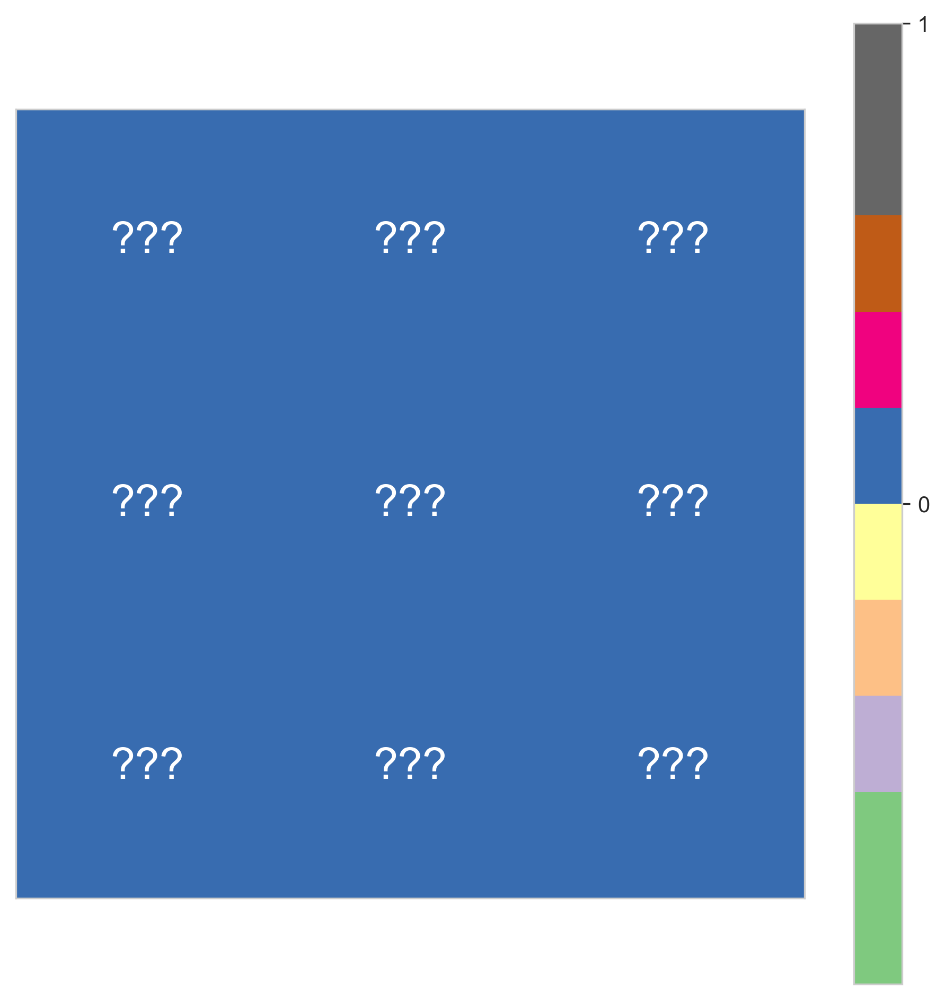

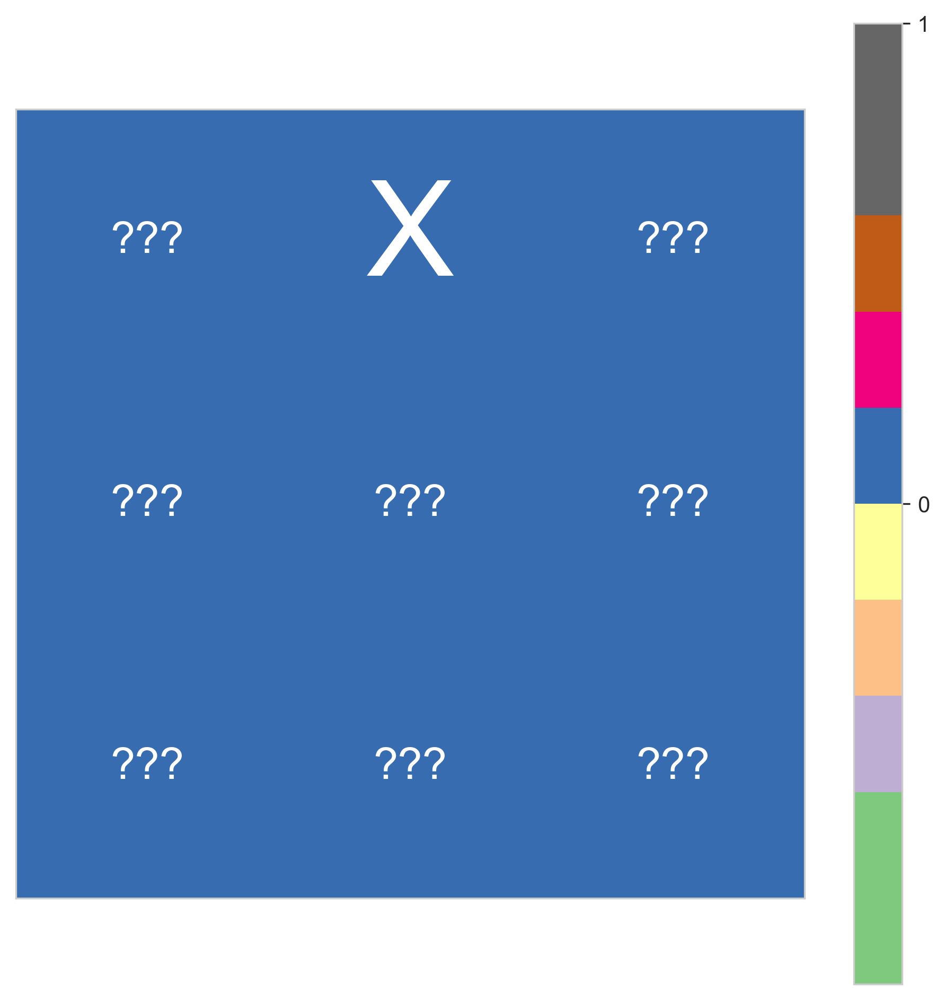

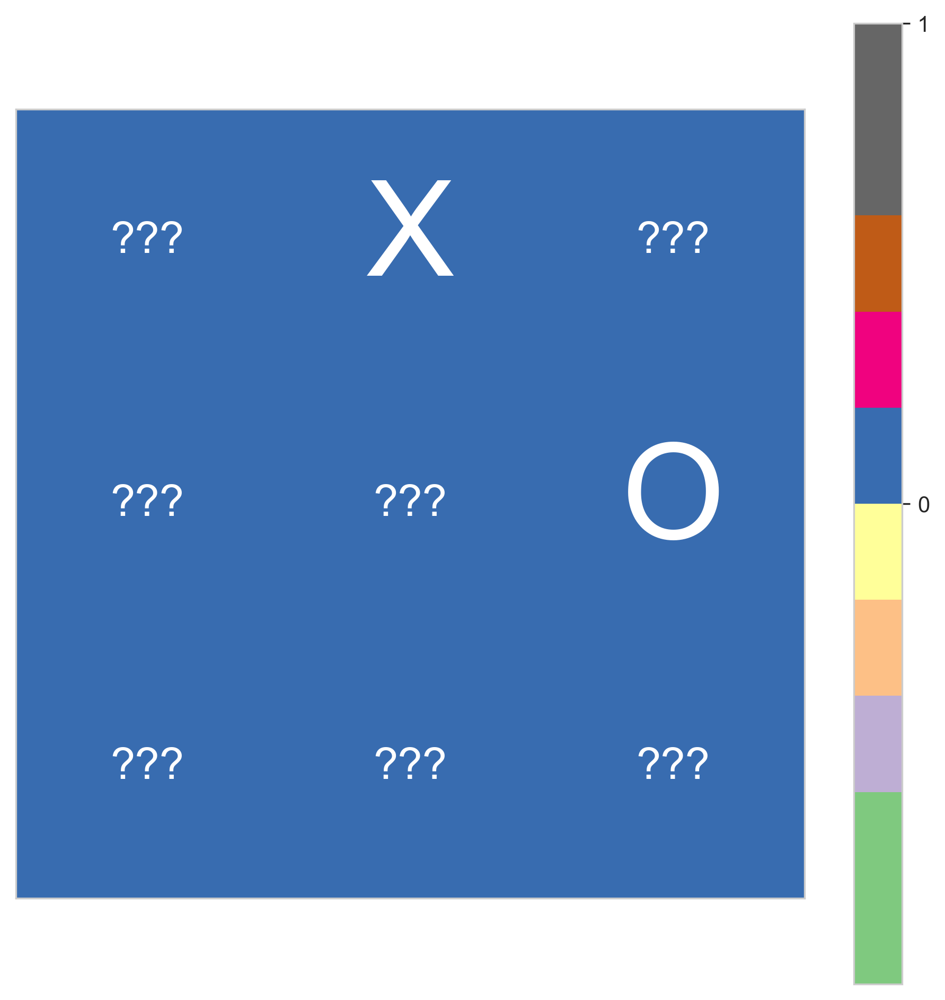

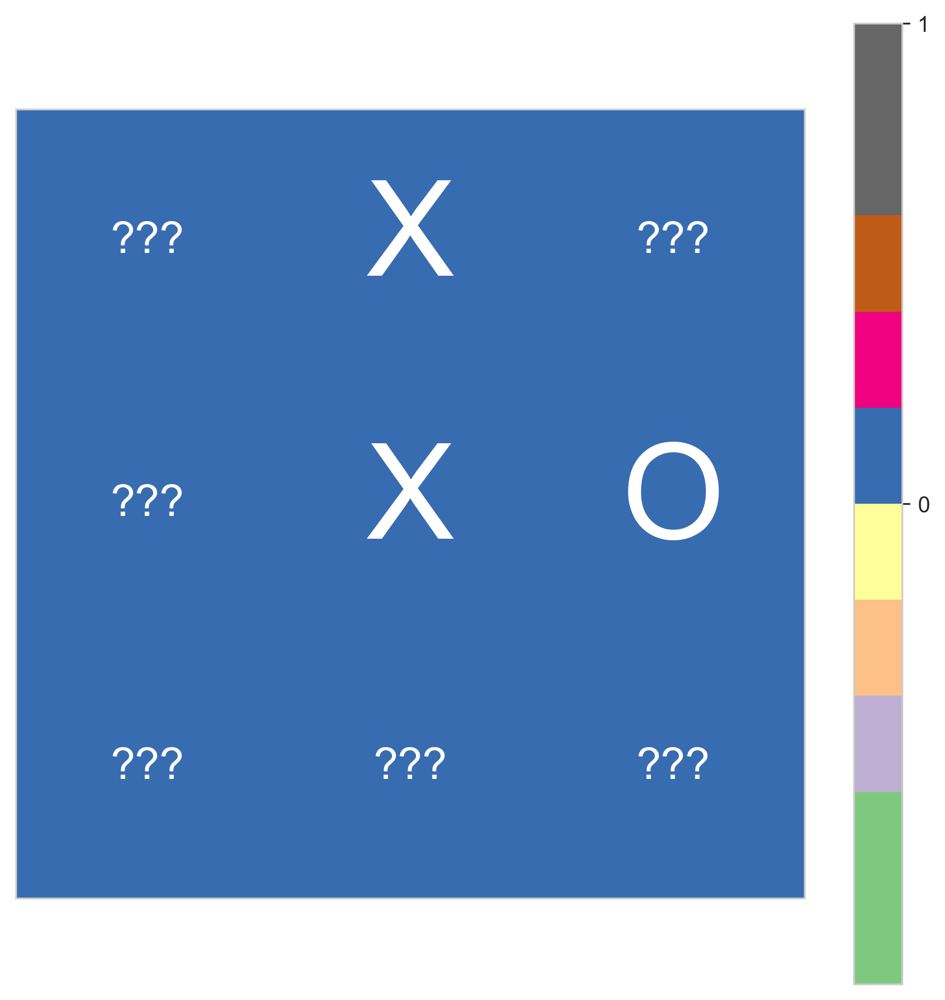

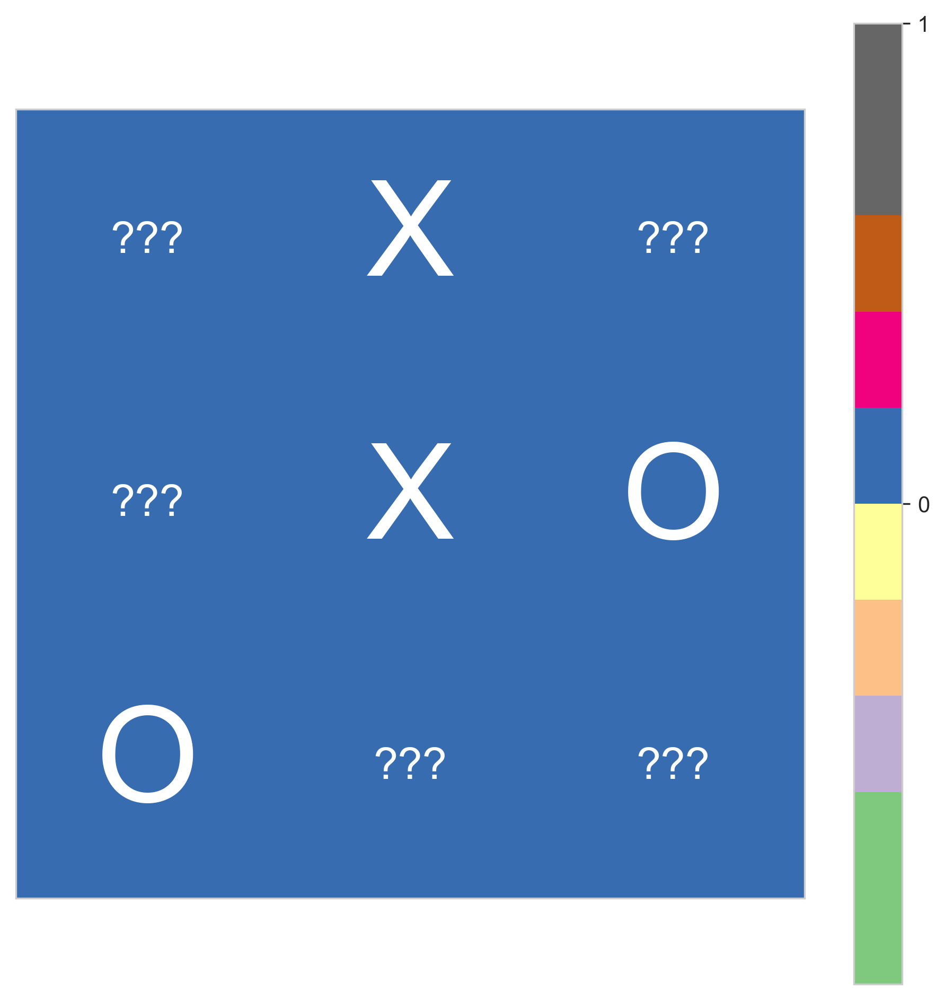

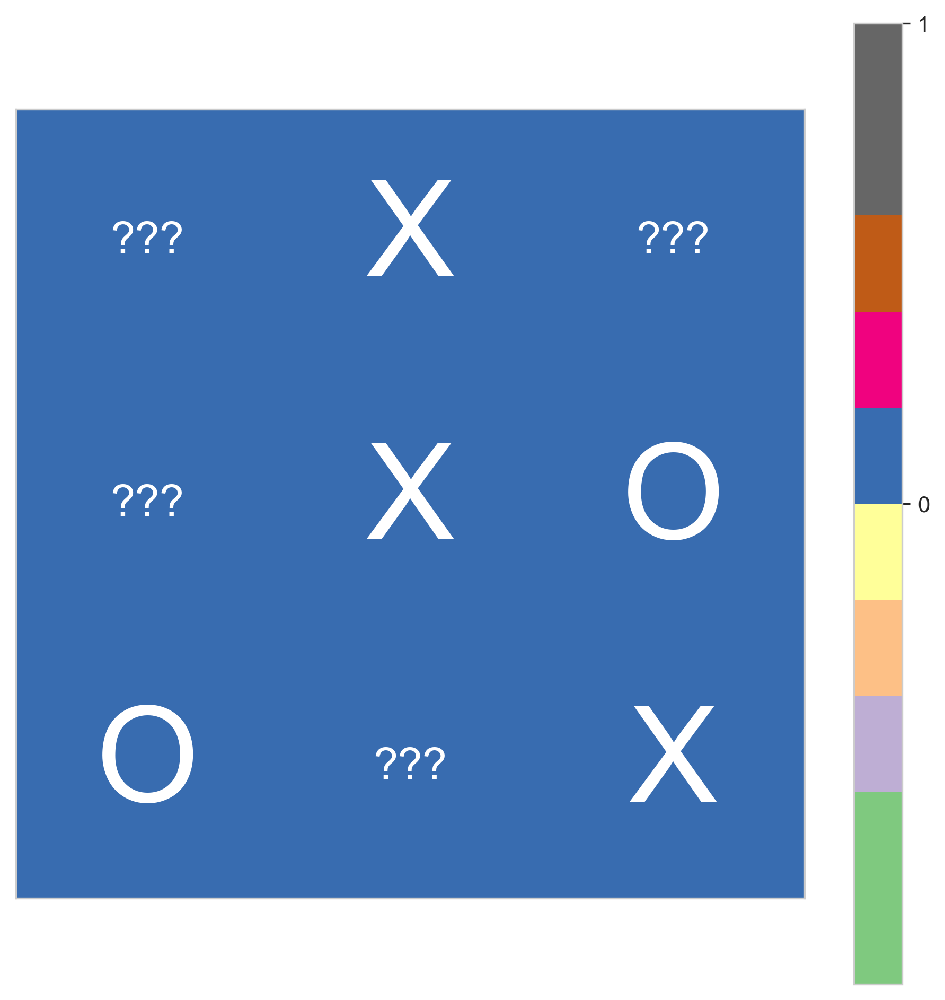

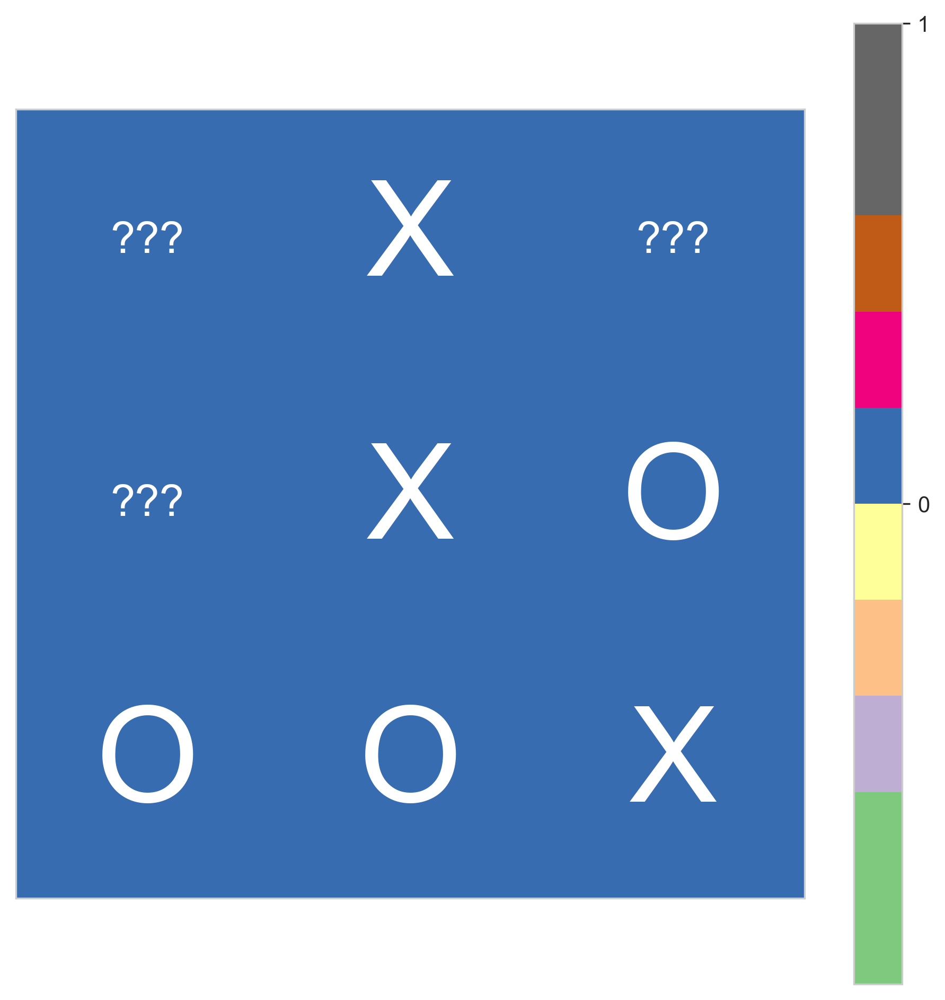

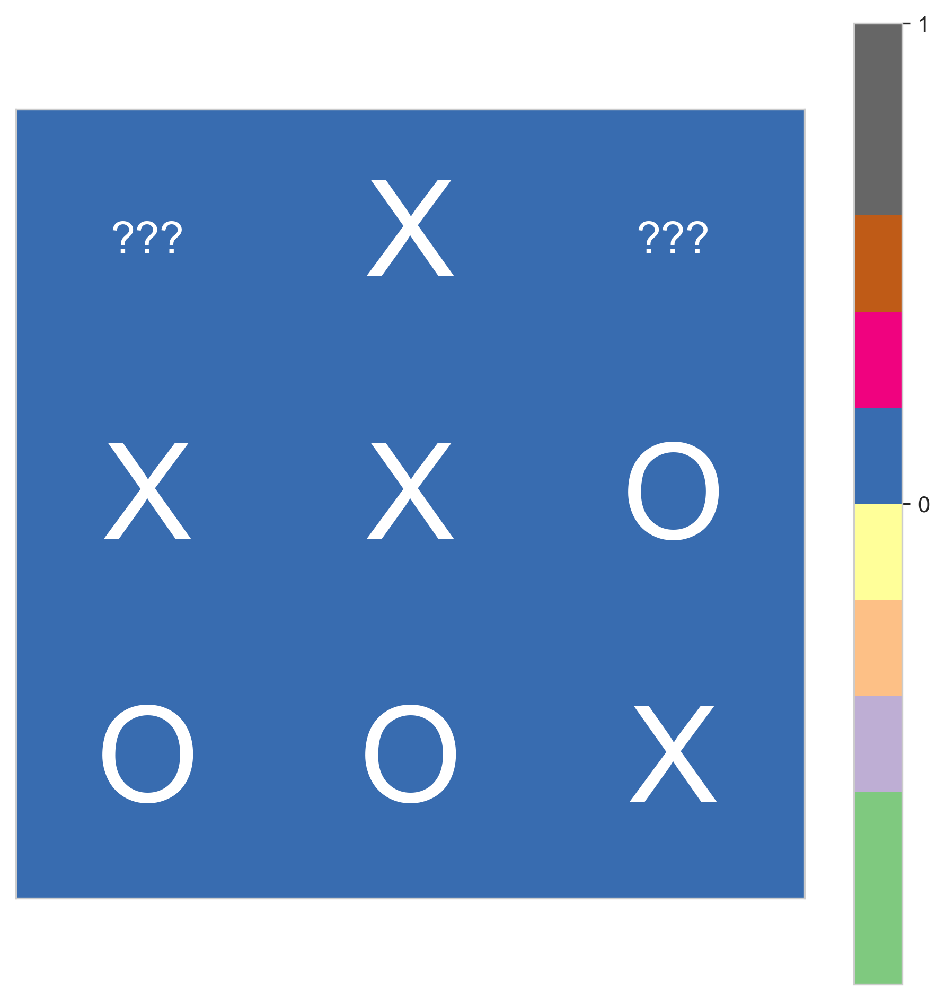

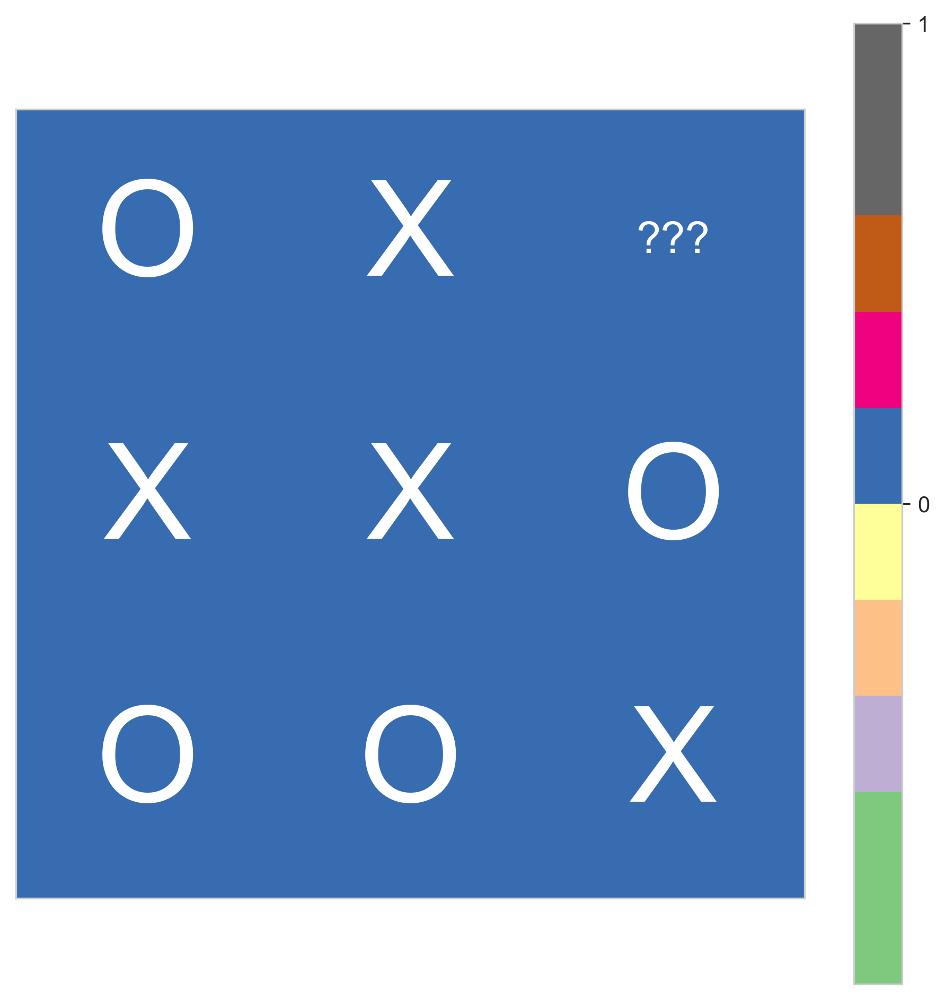

In [44]:
env = TicTacToe(n_rows=3, n_cols=3, n_win=3)
plot_test_game(env, None, None, random_crosses=True, verbose=False)

# Часть 1: крестики-нолики при помощи Q-обучения

Среду и изначальную реализацию агента возьмем из материалов лекции.

Учим играть за крестики. Используется рандомная стратегия за нолики для лучшего исследования. Агента учим играть за каждую сторону отдельно. Вероятно, этого можно было избежать инвертировав позиции крестов и нулей в кэше и награду

In [54]:
class QAgent():
    def __init__(self, epsilon=0.1, epsilon_decay=0.999, agent_side=1):
        self.Q = {}
        self.agent_side = agent_side
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        
    def doEpsDecay(self):
        self.epsilon = self.epsilon * self.epsilon_decay
    
    def getAction(self, s, num_actions, init_zero=False):
        if s not in self.Q:
            if init_zero:
                self.Q[s] = np.zeros(num_actions)
            else:
                self.Q[s] = np.random.random(size=num_actions) * 2 - 1  
        return np.argmax(self.Q[s]) if np.random.rand() > self.epsilon else np.random.randint(num_actions)

    def getActionGreedy(self, s, num_actions, init_zero=False):
        if s not in self.Q:
            return np.random.randint(num_actions)
        return np.argmax(self.Q[s])
    
    def updateQ(self, s, a, r, s_new, num_actions, num_actions_new, alpha=0.1):
        if s not in self.Q:
            self.Q[s] = np.zeros(num_actions)
        if num_actions_new > 0:
            if s_new not in self.Q:
                self.Q[s_new] = np.zeros(num_actions_new)
            self.Q[s][a] += alpha * (r + self.Q[s_new].max() - self.Q[s][a])
        else:
            self.Q[s][a] += alpha * (r - self.Q[s][a])

In [120]:
from IPython.display import clear_output


def evaluate_agent(env, agent, agent_side, n_attempts=100):
    win_ratio = 0.0
    lose_ratio = 0.0
    for ii in range(n_attempts):
        env.reset()
        done = False 
        s, actions = env.getHash(), env.getEmptySpaces()
        while not done:
            
            if agent_side == env.curTurn:
                a = agent.getActionGreedy(s, len(actions), init_zero=True)
                (s_new, actions_new, turn_num), r, done, _ = env.step(actions[a])
            else:
                a = np.random.randint(len(actions))
                (s_new, actions_new, turn_num), r, done, _ = env.step(actions[a])
                
            r = r * agent_side
            
            
            s = s_new
            actions = actions_new
            
        win_ratio += (r == 1)
        lose_ratio += (r == -1)
    win_ratio = win_ratio / n_attempts
    lose_ratio = lose_ratio / n_attempts
    
    return win_ratio, lose_ratio, 1 - win_ratio - lose_ratio


def plot_progress(learning_progress, tag="cross"):
    
    clear_output(wait=True)
    
    plt.figure(figsize=(6,4))
    #plt.xscale("log")
    plt.title(tag)
    plt.grid(True)
    
    plt.xlabel("Episodes")
    plt.ylabel("Ratio")
    
    plt.ylim([0, 1])
    
    x = np.array([lp[0] for lp in learning_progress])
    y = np.array([lp[1] for lp in learning_progress])
    
    plt.plot(x, y[:, 0], "g-", label="Win Ratio")
    plt.plot(x, y[:, 1], "r-", label="Loss Ratio")
    plt.plot(x, y[:, 2], "y-", label="Draw Ratio")
    
    plt.legend()
    plt.show()

def train_Q_learning(agent_side, alpha=0.1, epsilon=0.1, epsilon_decay=0.999, n_rows=3, n_cols=3, n_win=3, episodes=100):
    
    agent = QAgent(epsilon=epsilon, epsilon_decay=epsilon_decay, agent_side=agent_side)
    
    env = TicTacToe(n_rows=n_rows, n_cols=n_cols, n_win=n_win)
    
    learning_progress = []
    
    for ii in range(episodes):
        env.reset()
        done = False 
        s, actions = env.getHash(), env.getEmptySpaces()
        while not done:
            
            if agent.agent_side == env.curTurn:
                a = agent.getAction(s, len(actions), init_zero=True)
                (s_new, actions_new, turn_num), r, done, _ = env.step(actions[a])
            else:
                a = np.random.randint(len(actions))
                (s_new, actions_new, turn_num), r, done, _ = env.step(actions[a])
                
            r = r * agent_side
            
            agent.updateQ(s, a, r, s_new, len(actions), len(actions_new), alpha=alpha)
            
            s = s_new
            actions = actions_new

        
        if ii % int(episodes * 0.01) == 0:

            #print(f"Progress: {ii / episodes * 100} %")
            learning_progress.append((ii, evaluate_agent(env, agent, agent_side, n_attempts=100)))
            plot_progress(learning_progress, tag= "cross" if agent_side == 1 else "naught")
            agent.doEpsDecay()
        
    return agent, learning_progress

## Сетка размера 3 на 3 

### Крестики

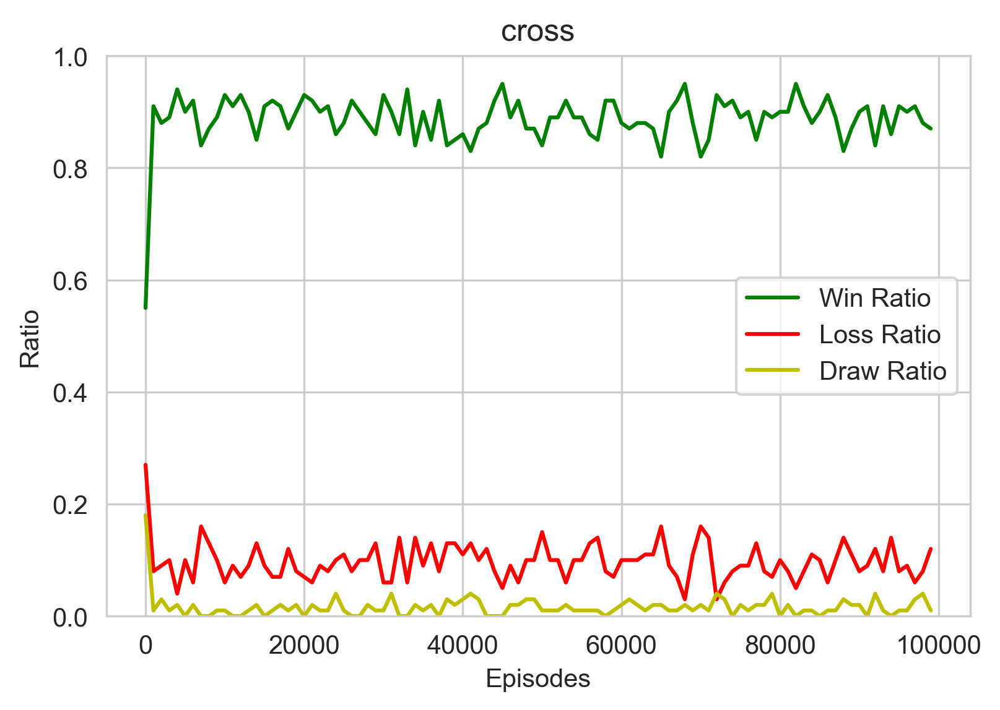

In [122]:
agent_cross, info = train_Q_learning(agent_side=1, alpha=0.05, episodes=int(1e5), epsilon=0.3, epsilon_decay = 0.95, )

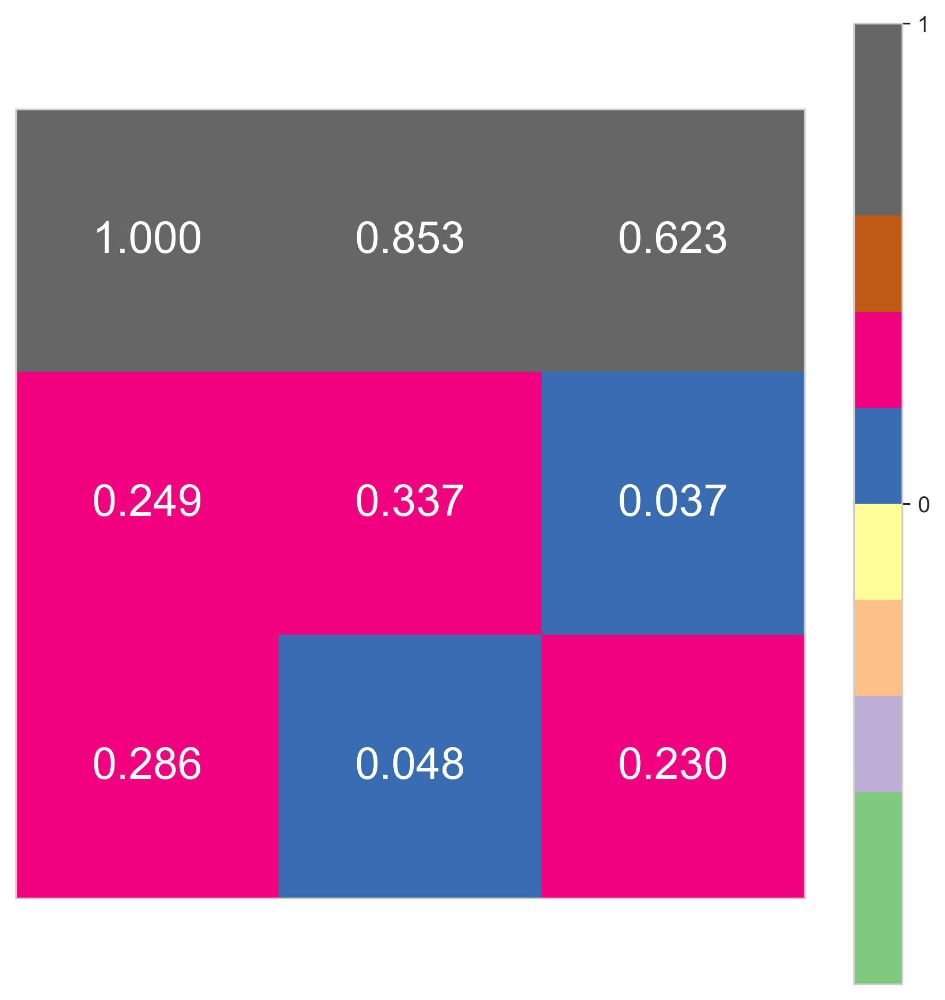

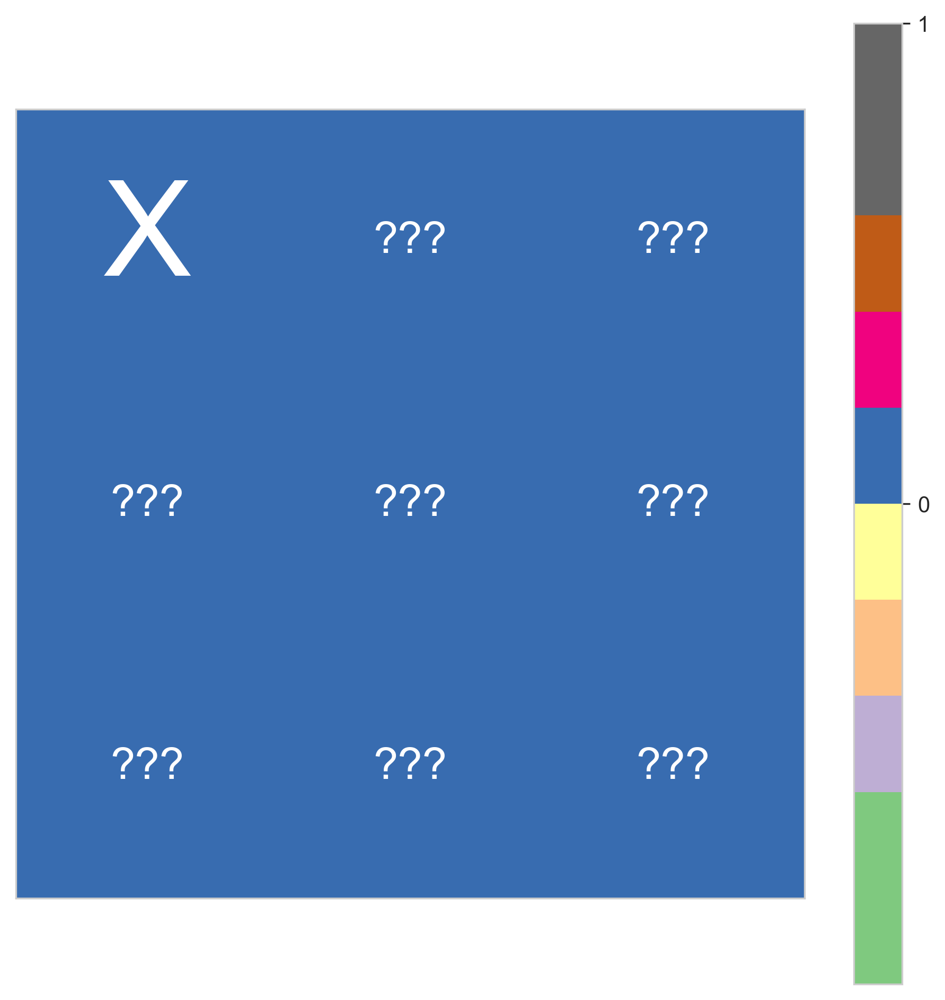

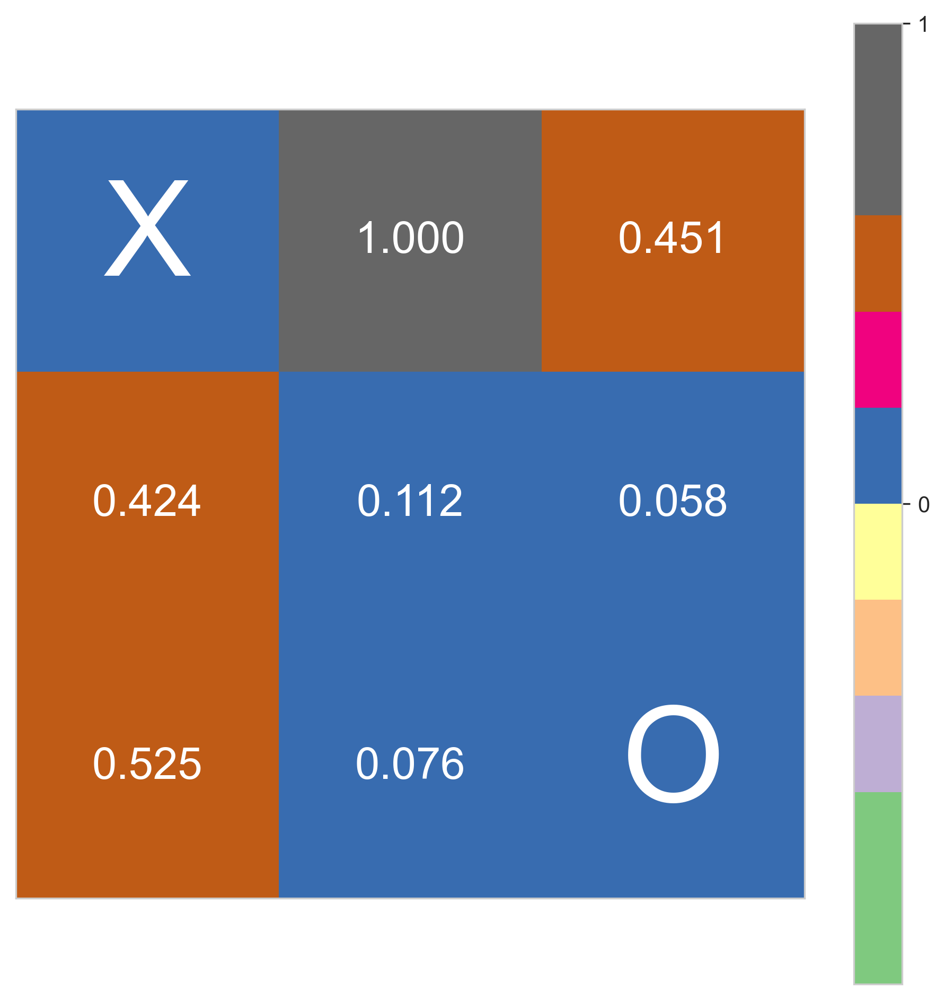

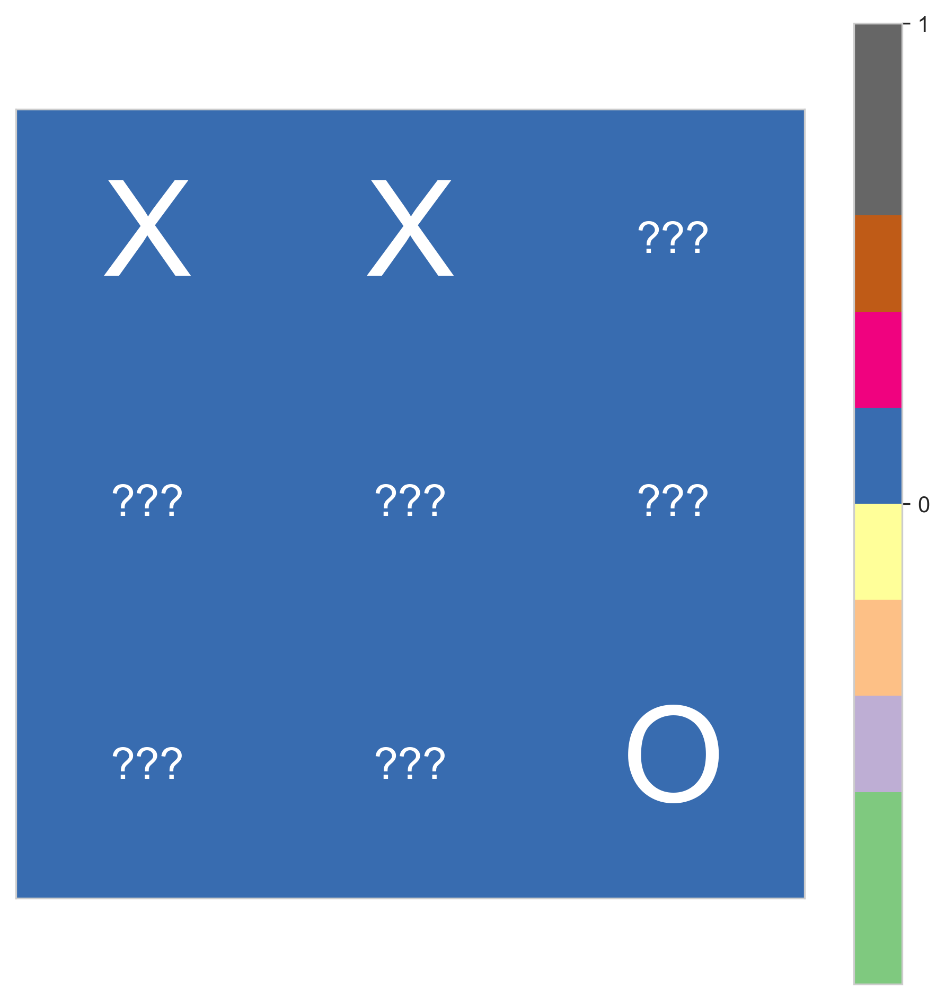

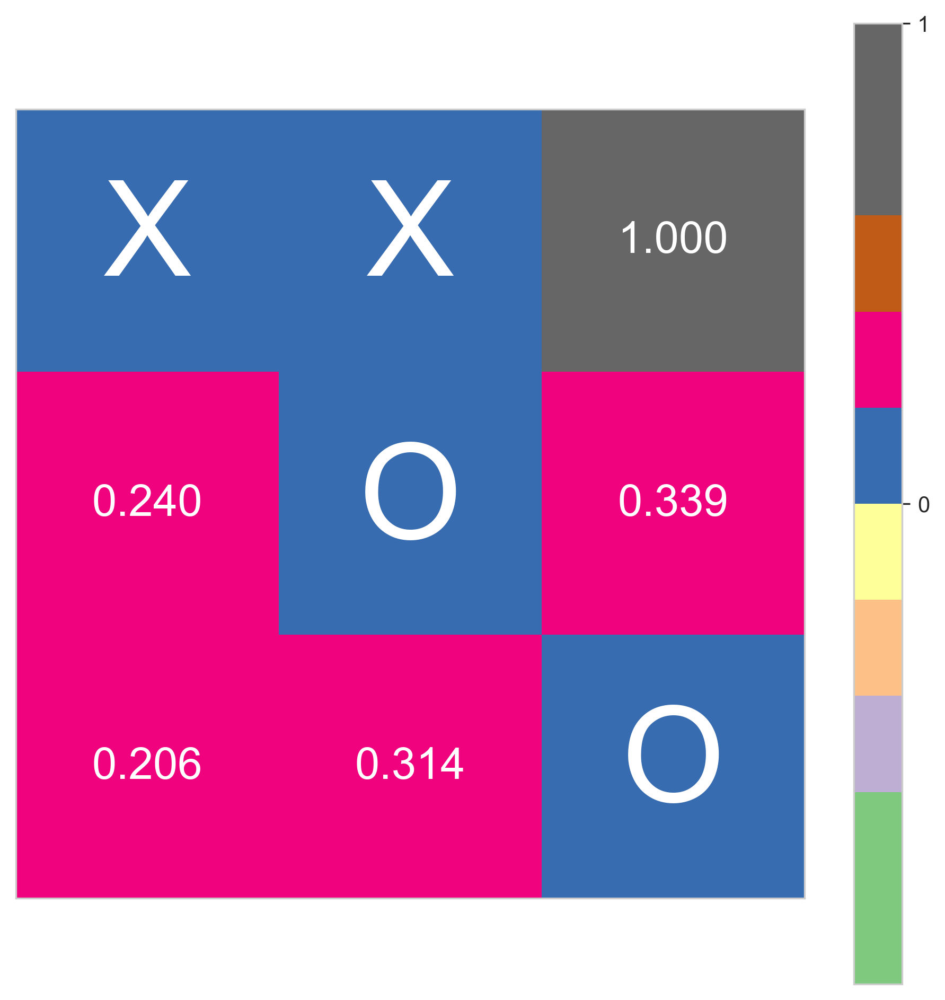

Крестики выиграли!


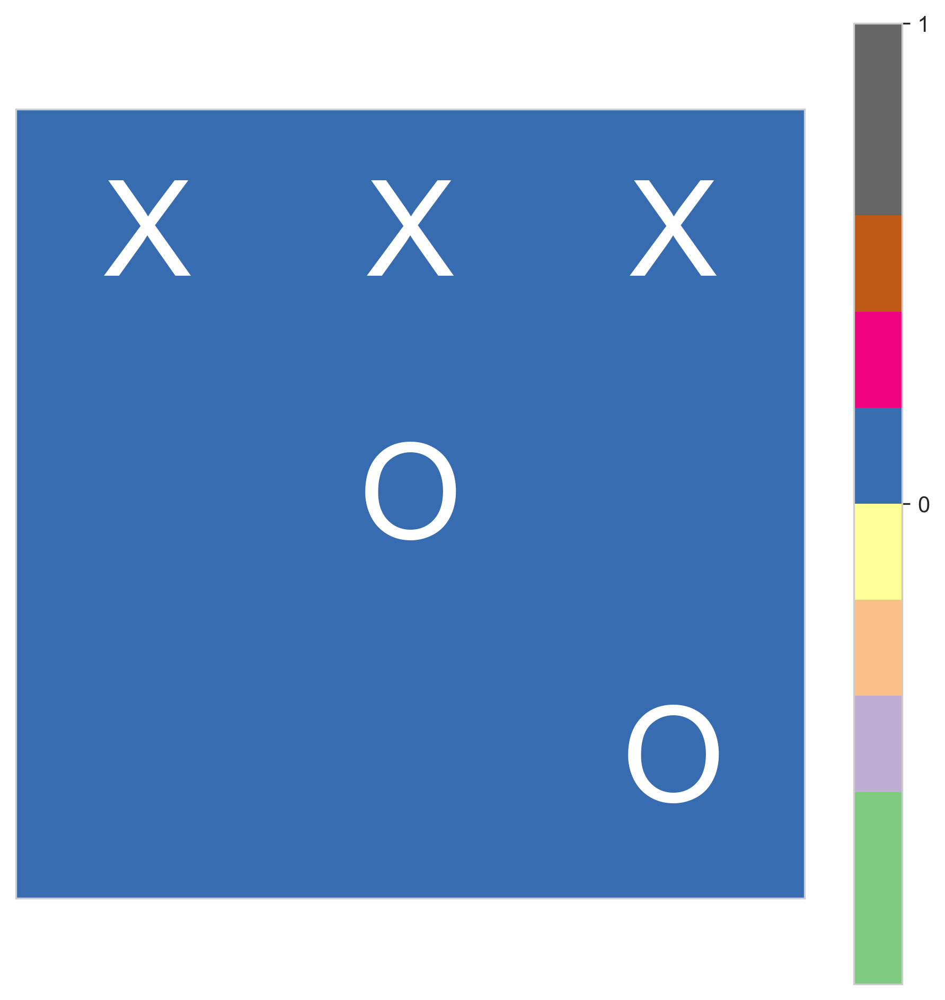

In [123]:
plot_test_game(env, agent_cross, None, random_crosses=False, random_naughts=True, verbose=False)

### Нолики

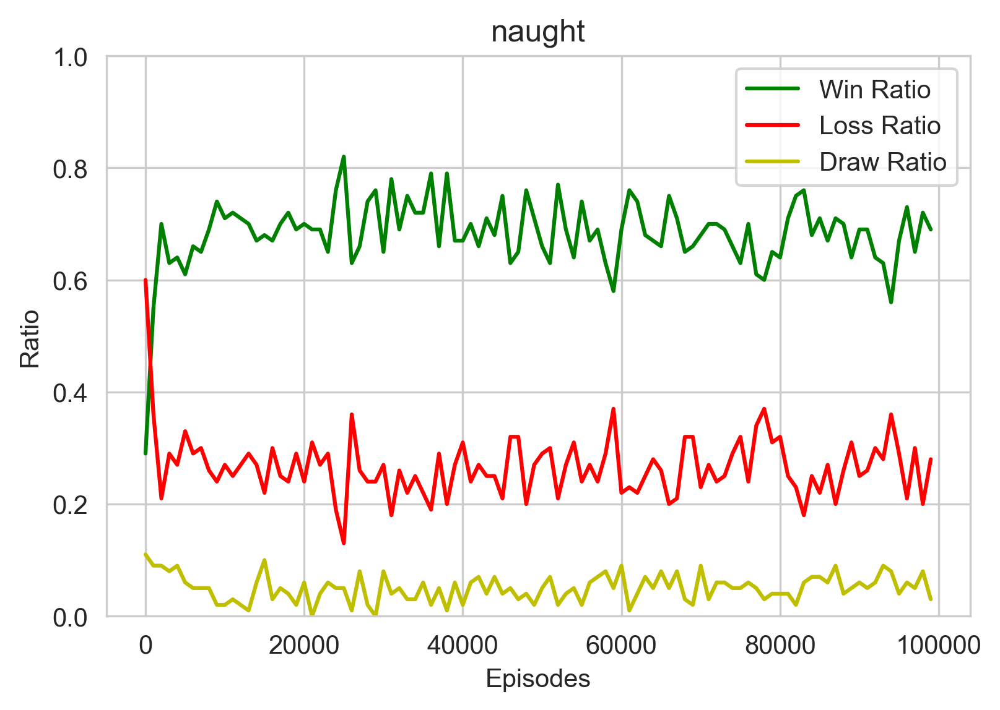

In [124]:
agent_naught, info = train_Q_learning(agent_side=-1, alpha=0.05, episodes=int(1e5), epsilon=0.3, epsilon_decay = 0.95, )

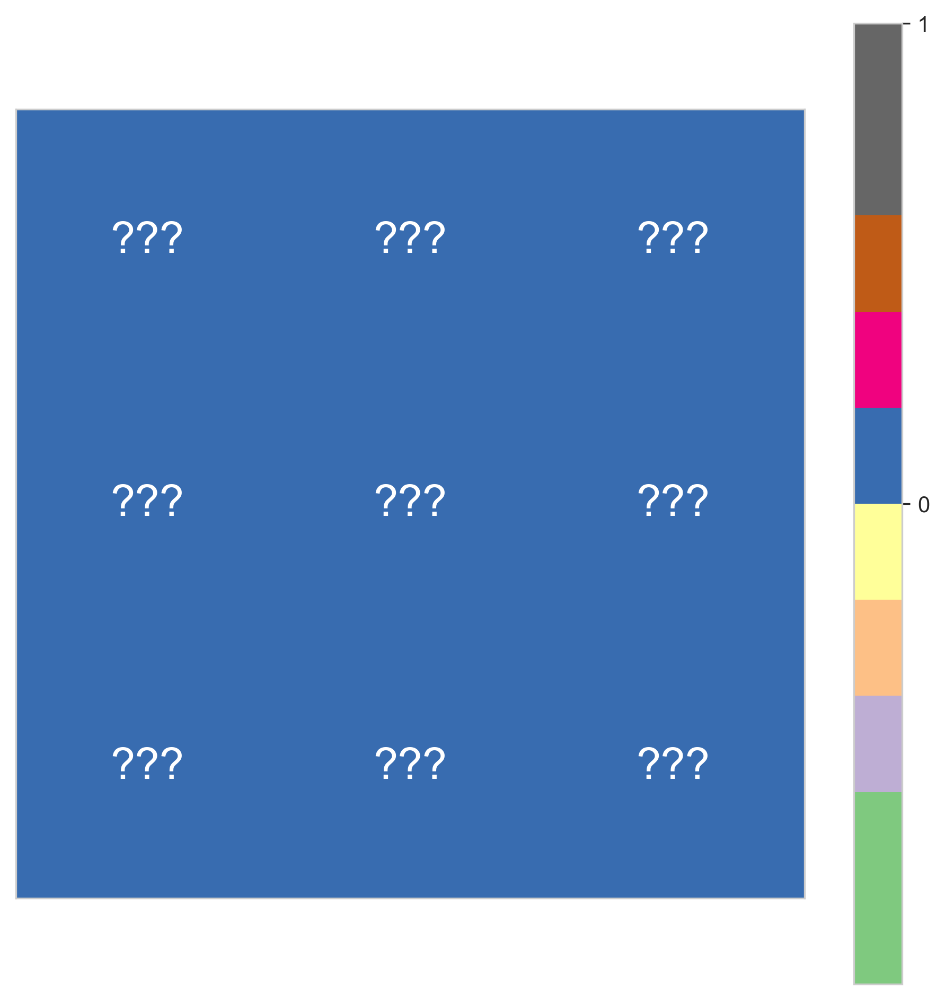

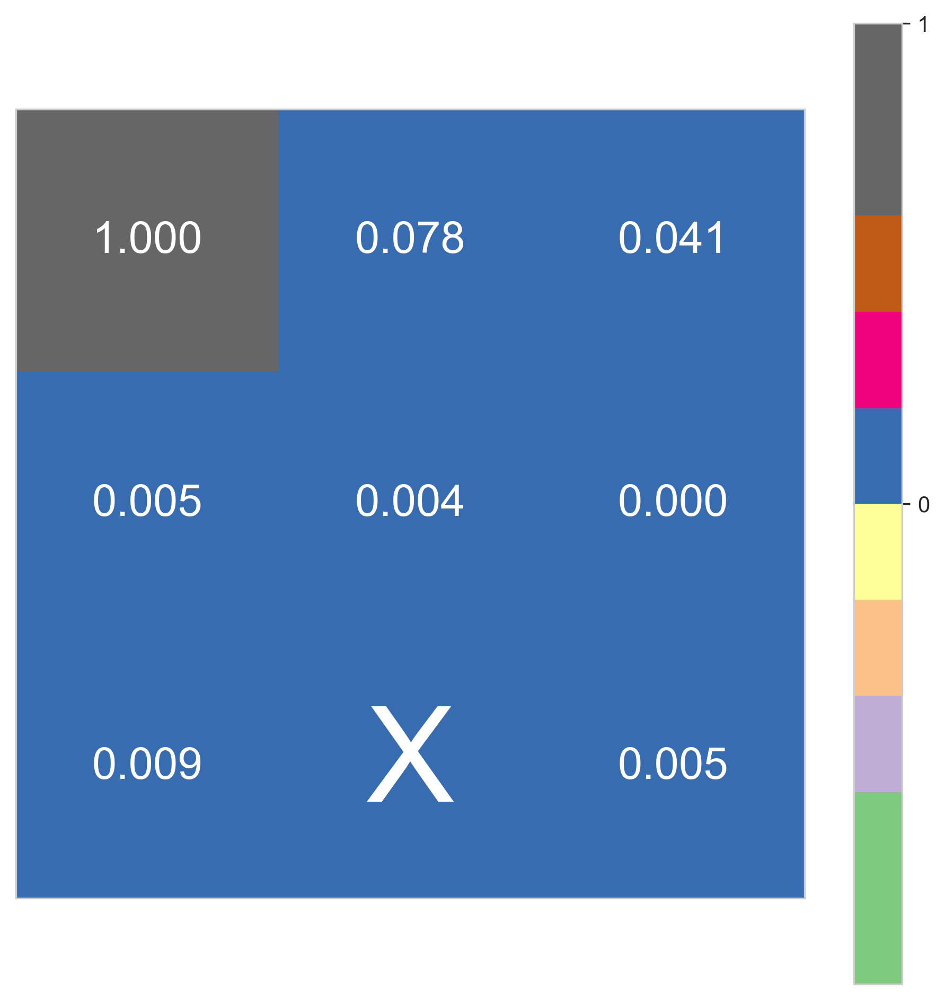

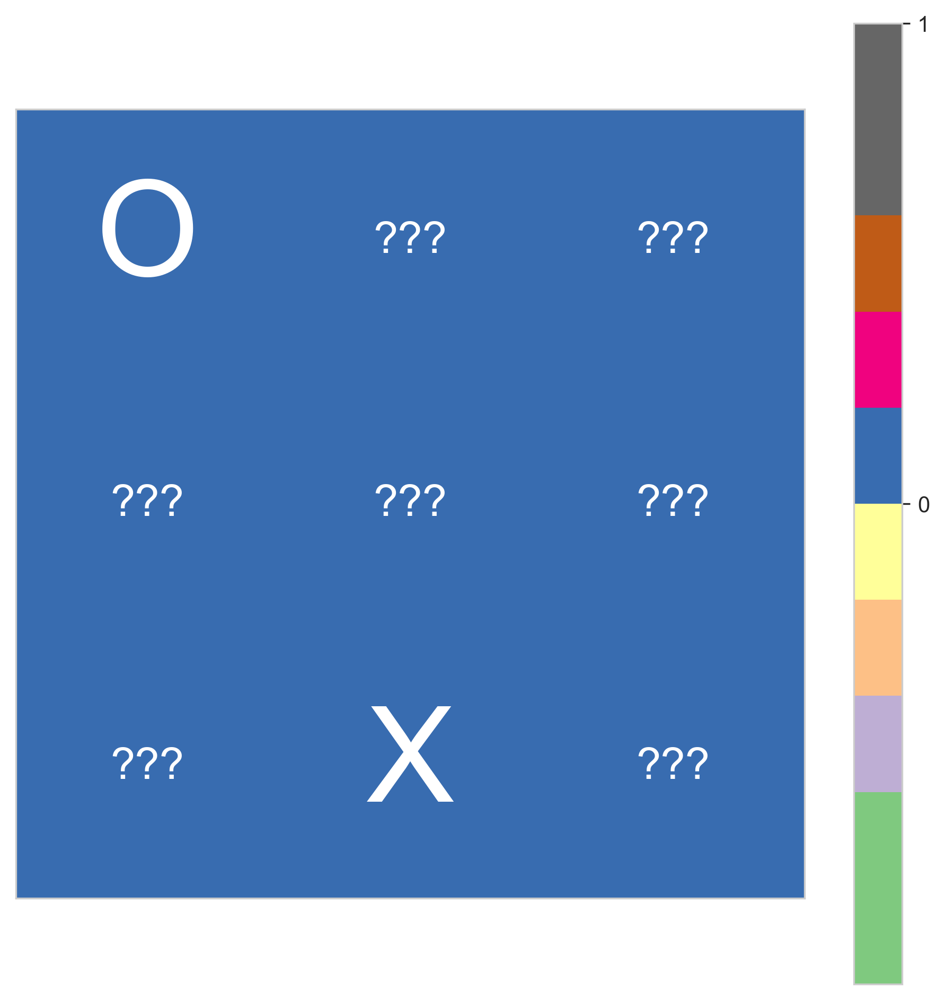

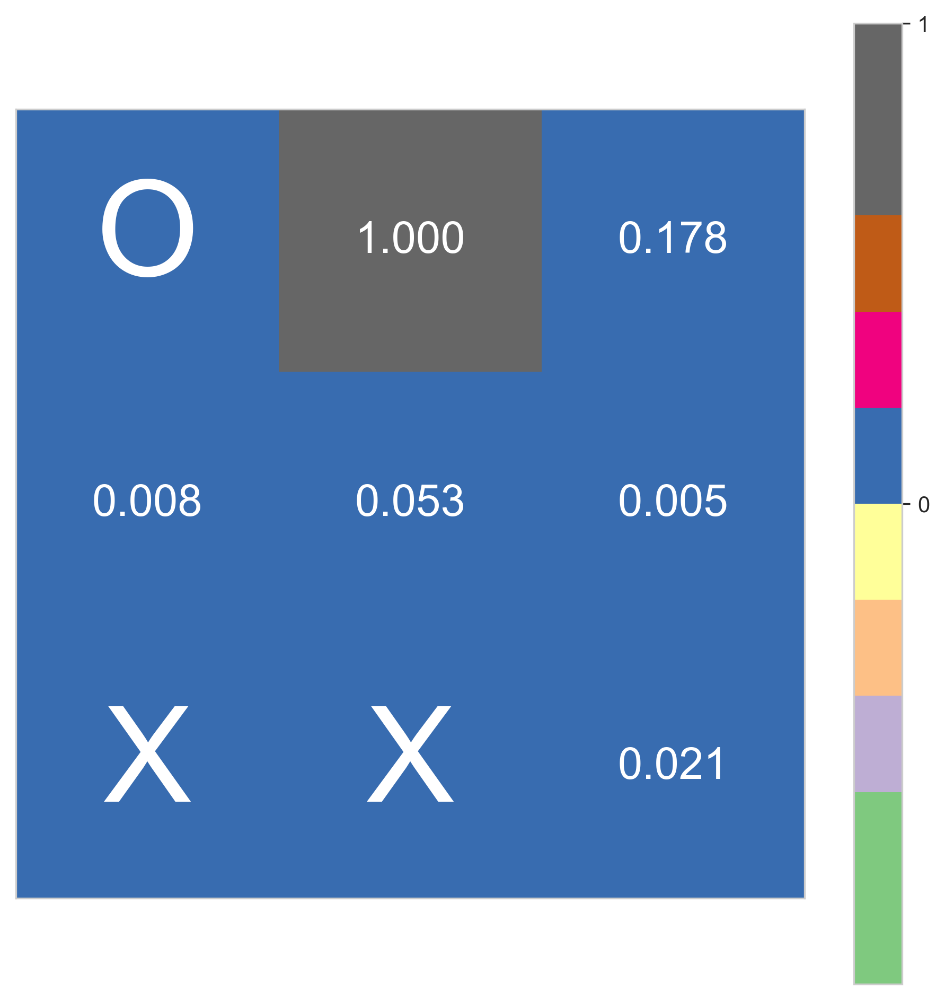

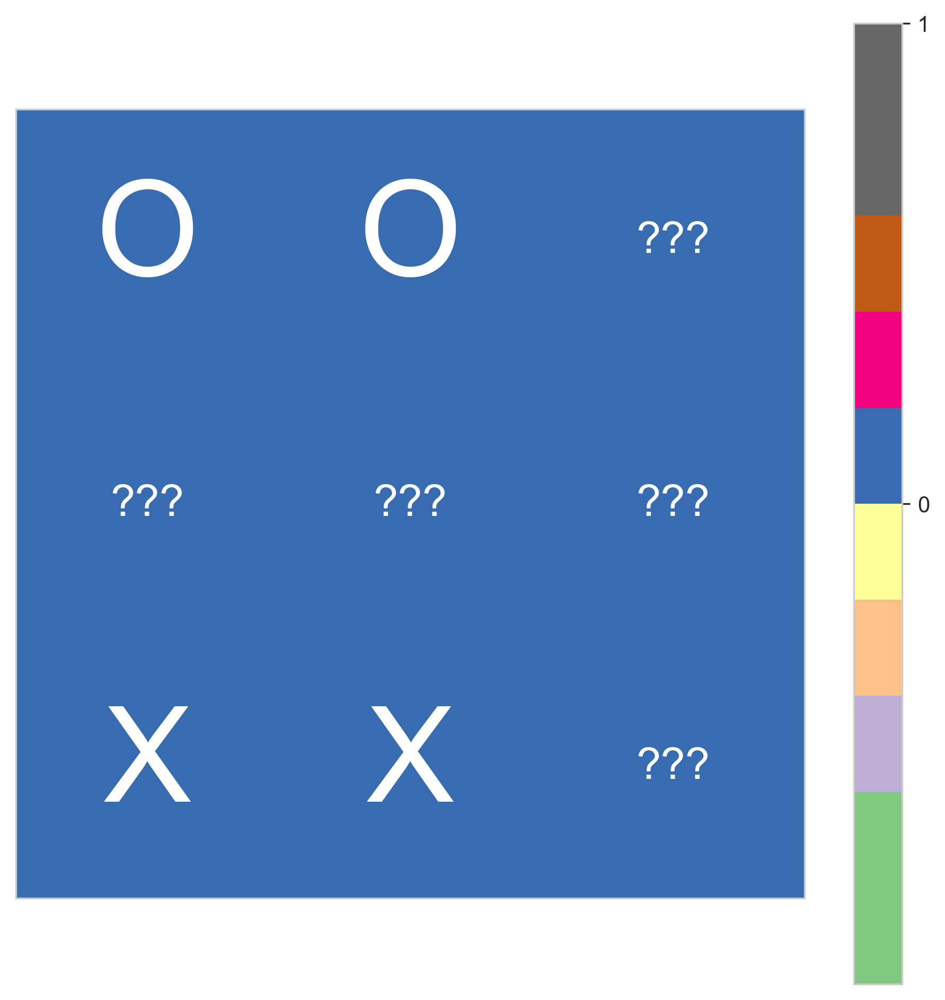

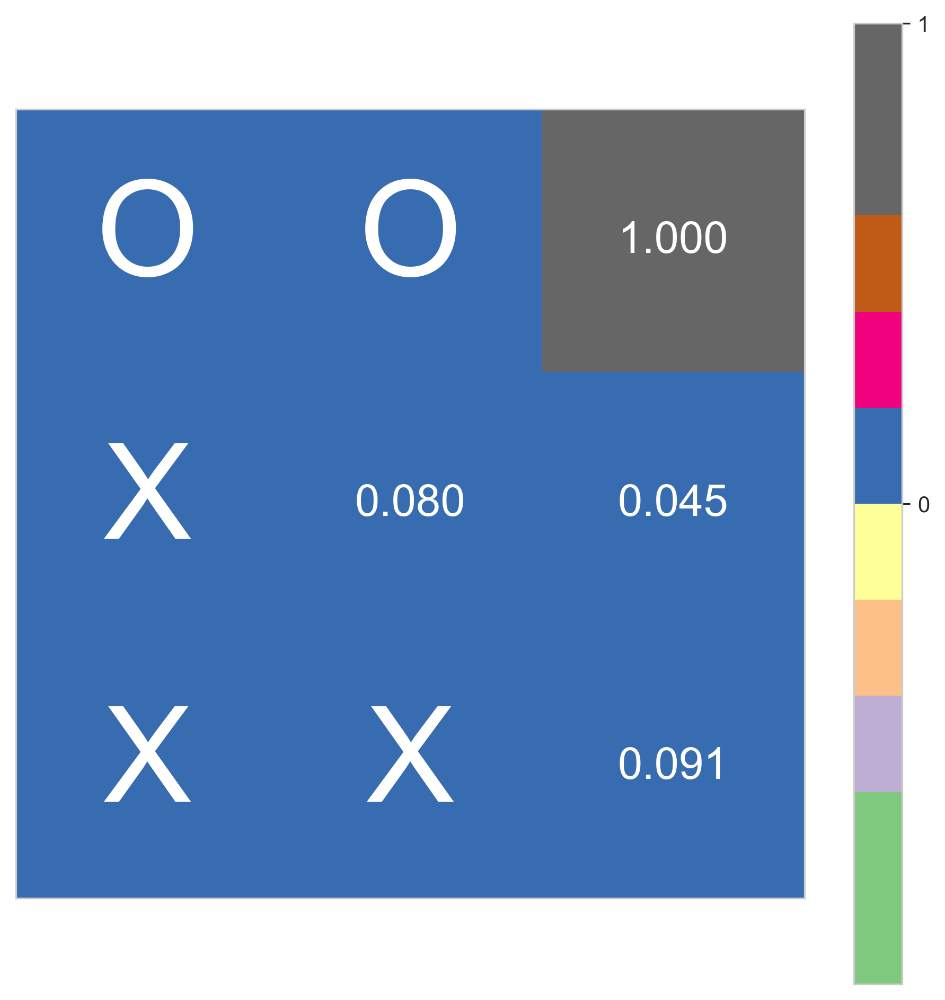

Нолики выиграли!


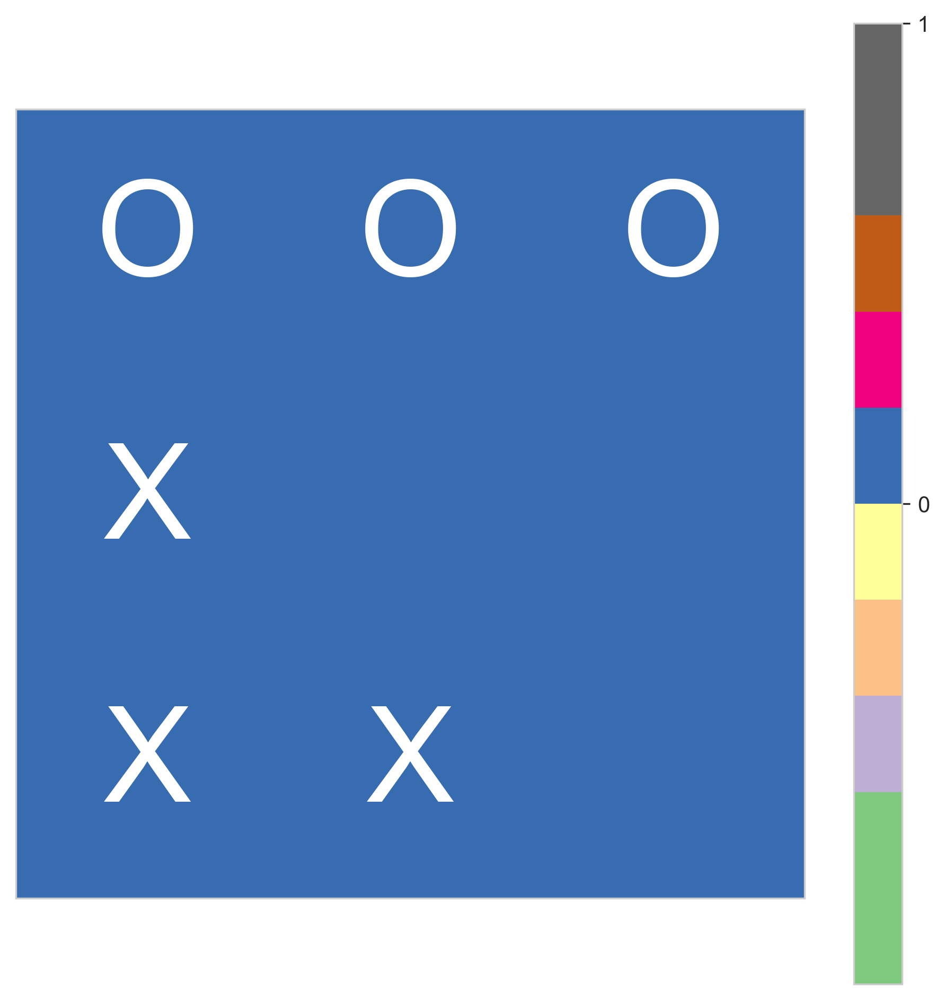

In [119]:
plot_test_game(env, None, agent_naught, random_crosses=True, random_naughts=False, verbose=False)

### Игра против друг друга

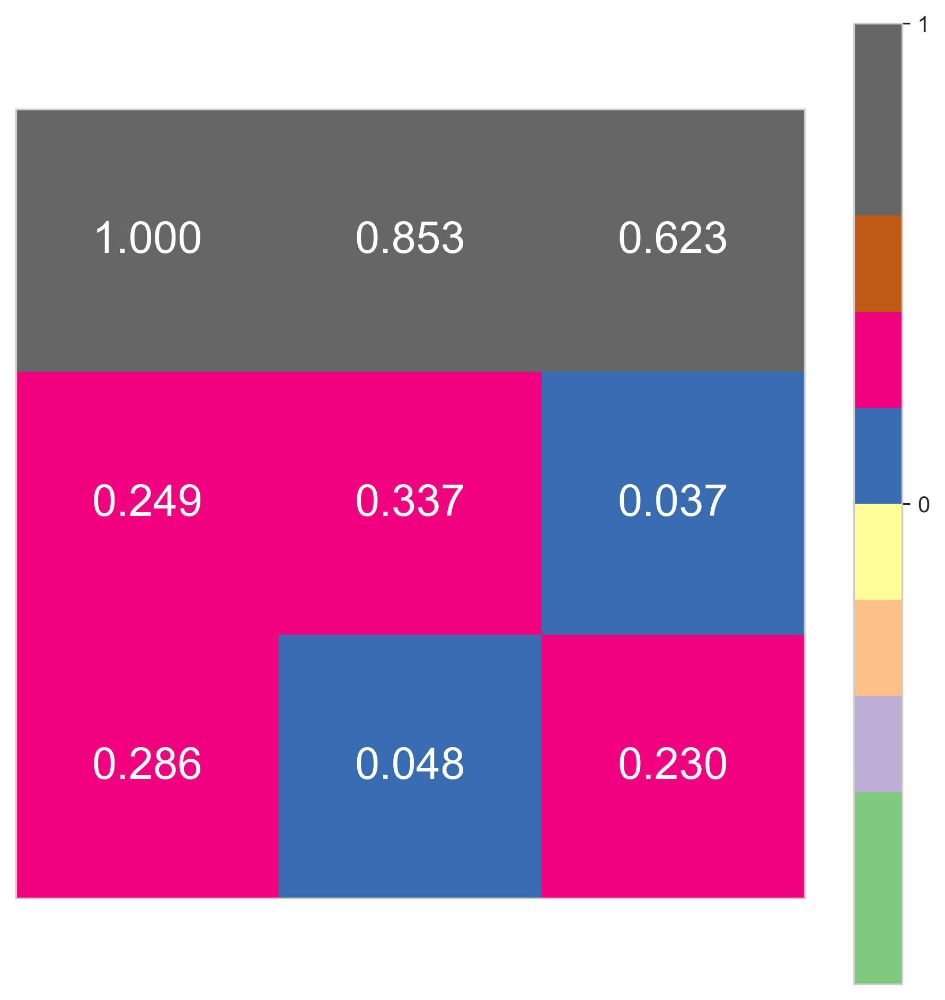

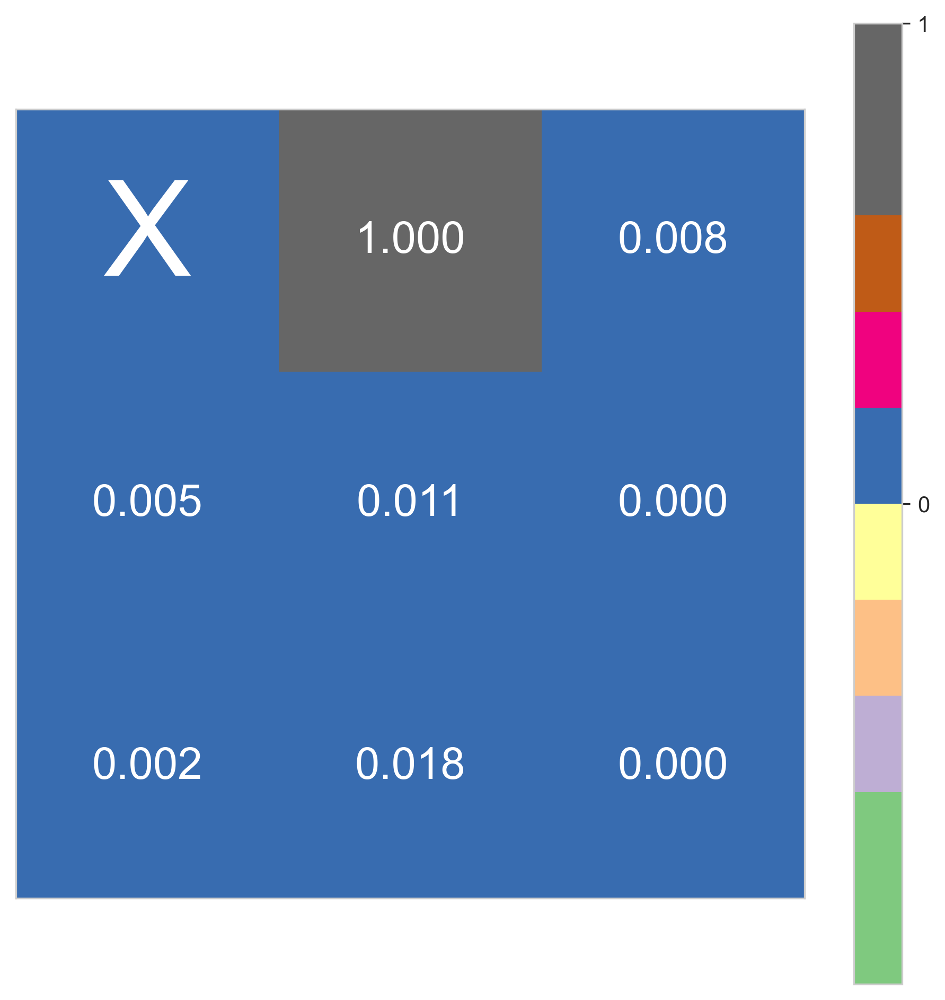

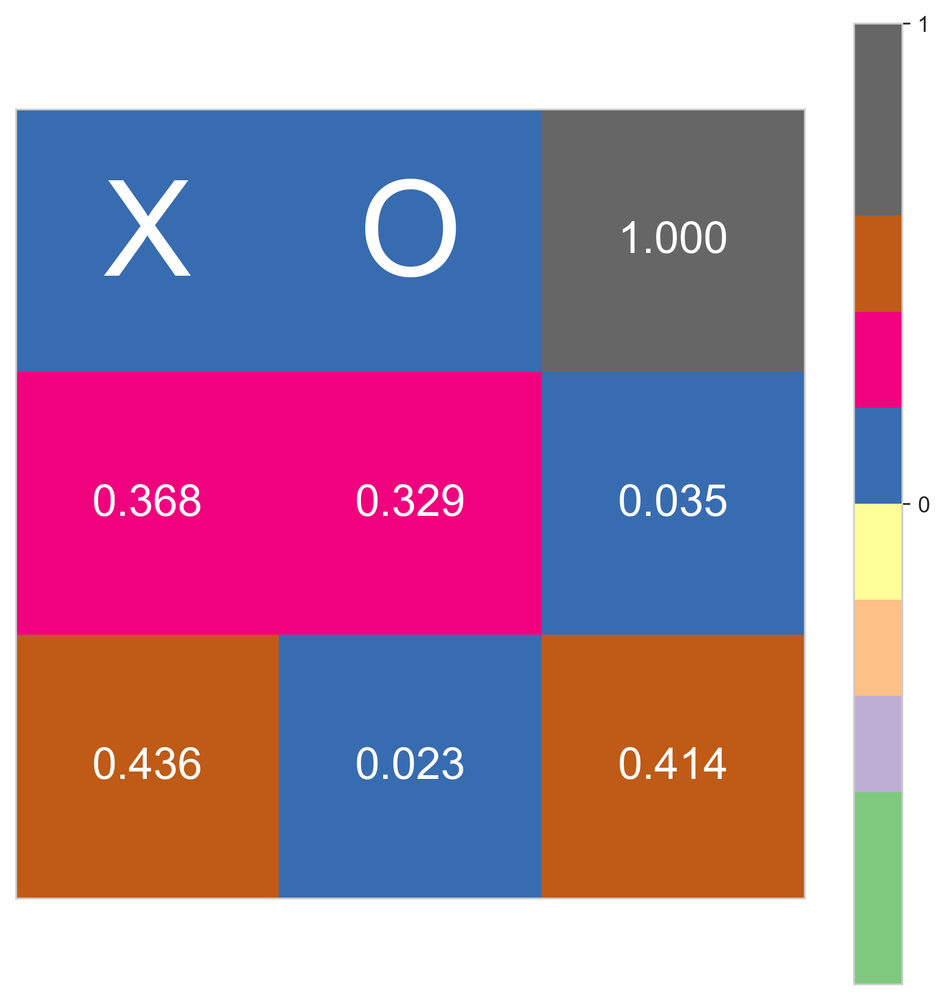

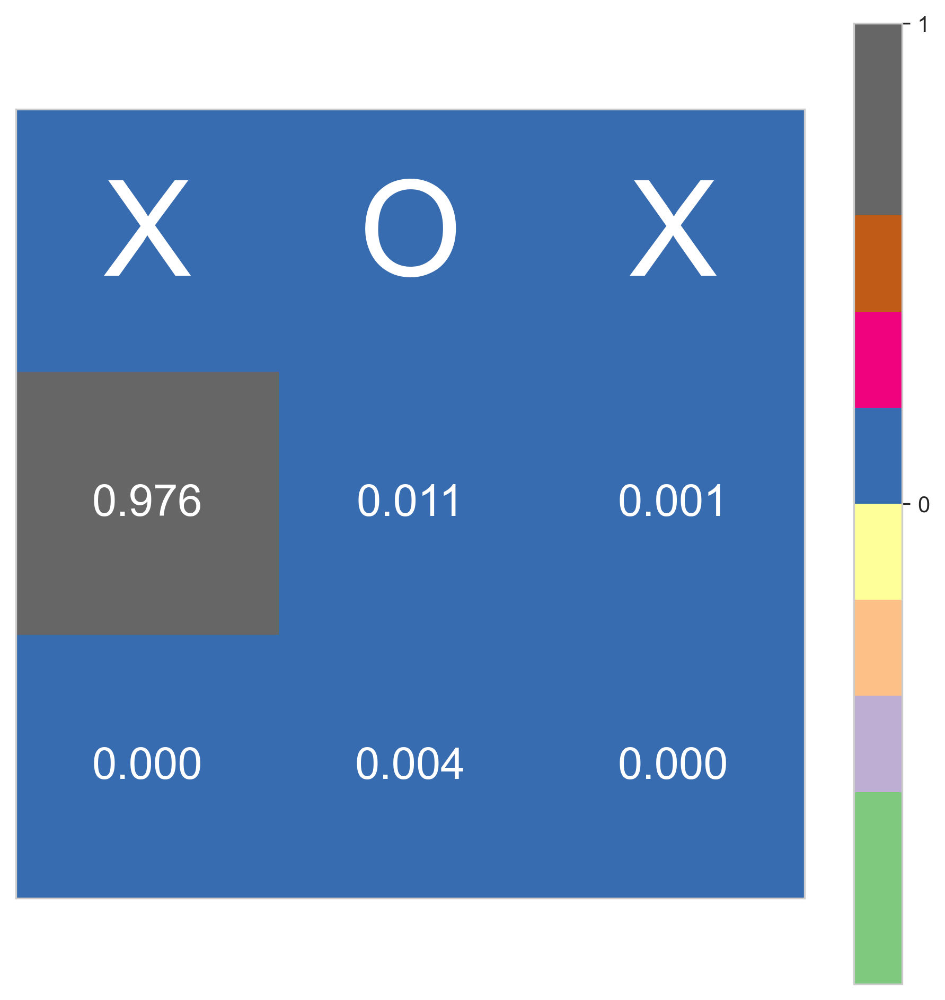

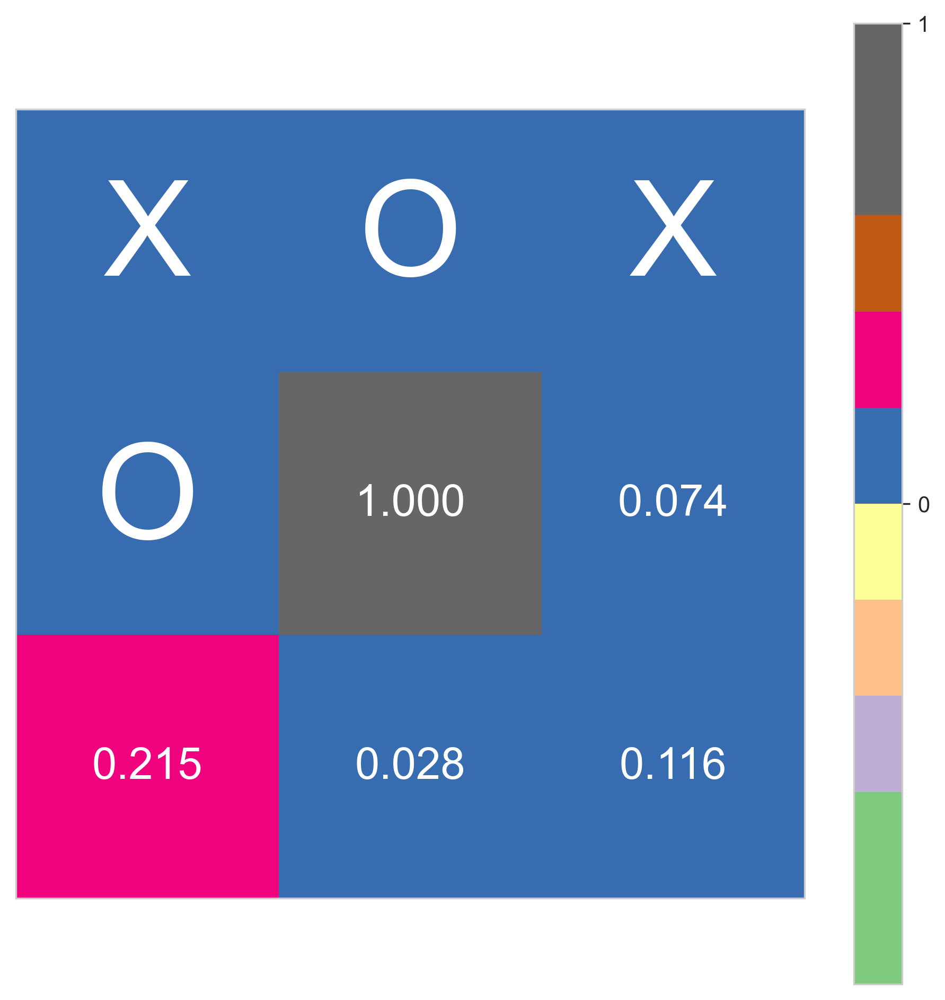

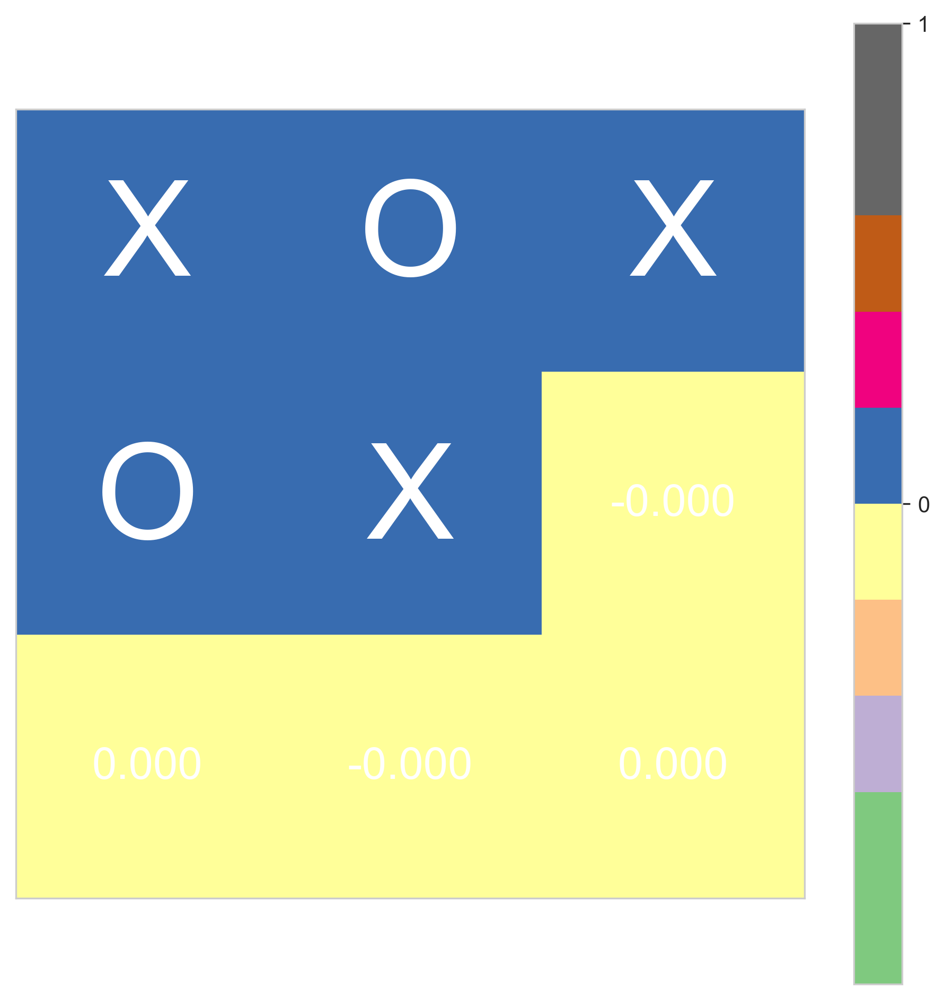

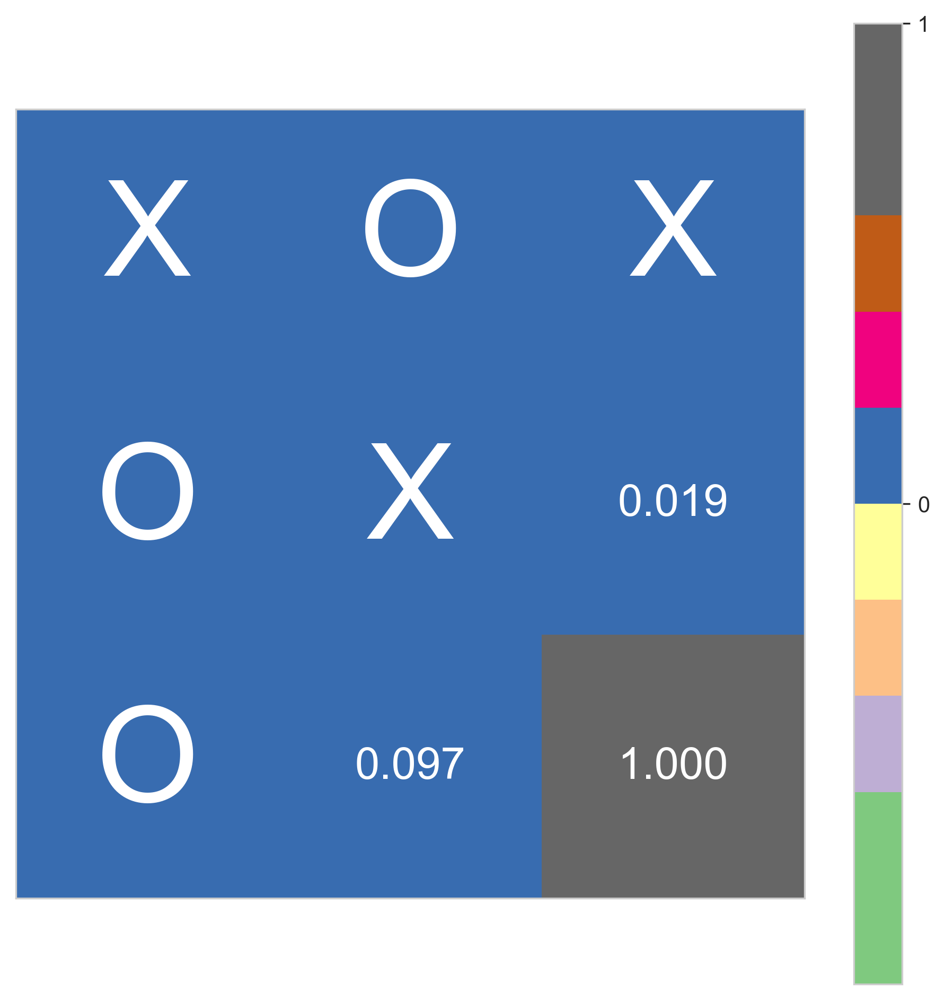

Крестики выиграли!


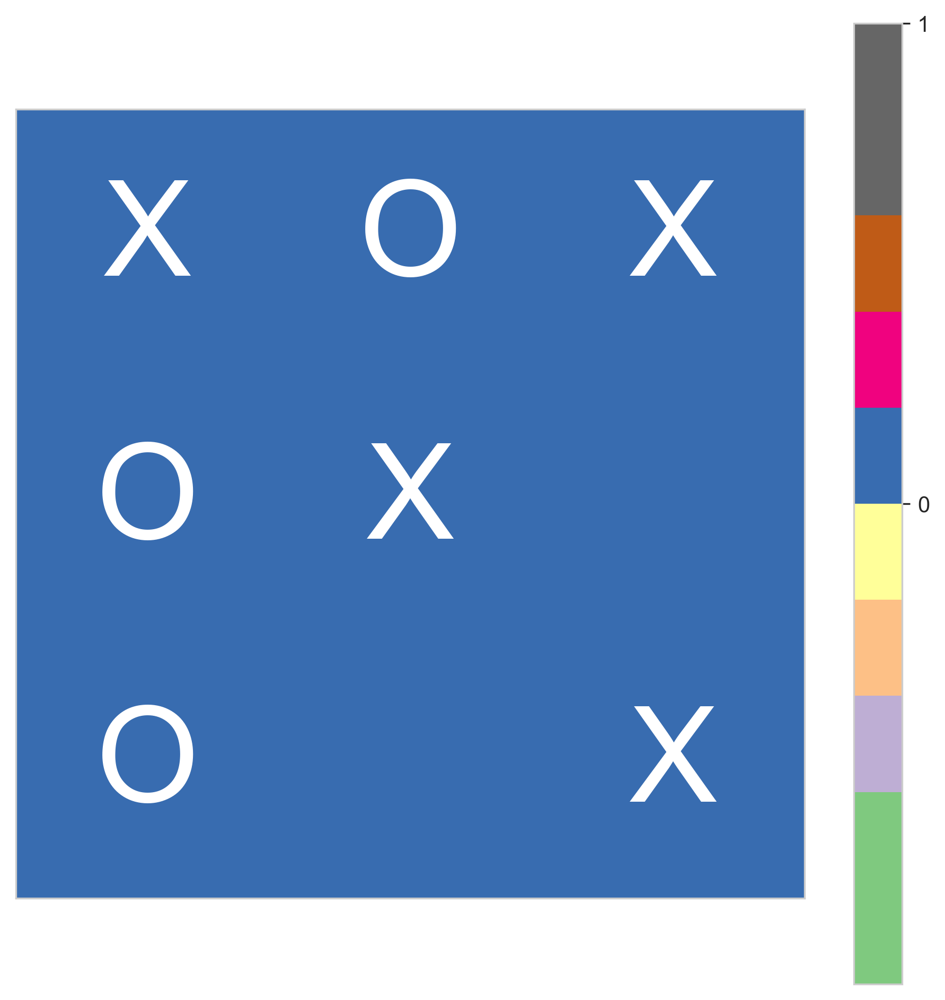

In [125]:
plot_test_game(env, agent_cross, agent_naught, random_crosses=False, random_naughts=False, verbose=False)

## Поле 5 на 5

In [132]:
env = TicTacToe(n_rows=5, n_cols=5, n_win=4)

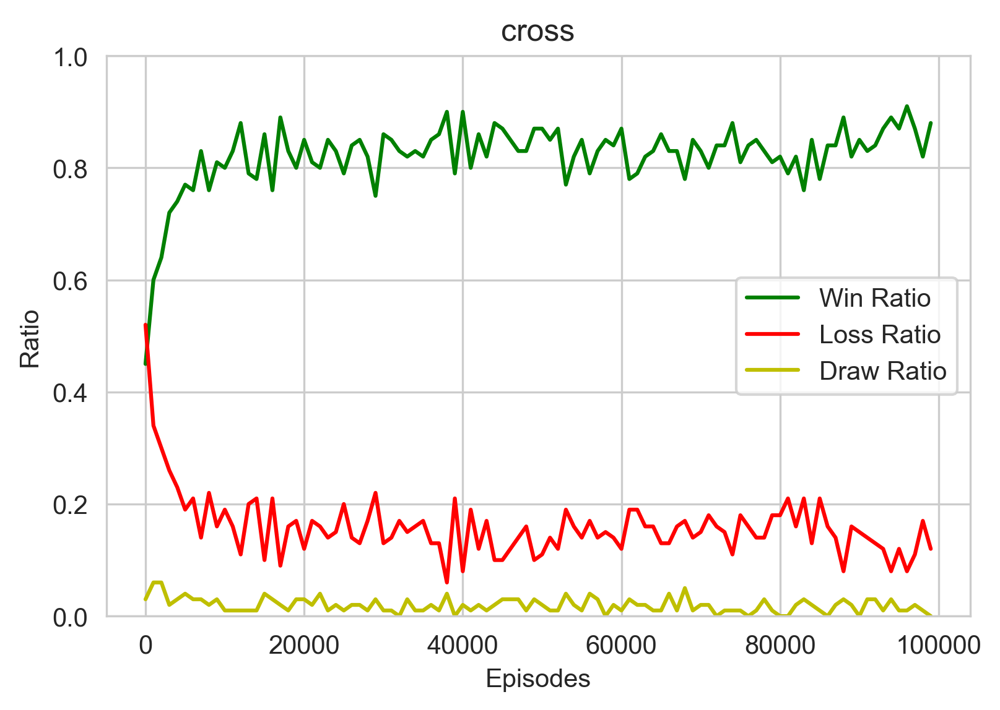

In [129]:
agent_cross, info = train_Q_learning(
    agent_side=1,
    alpha=0.05,
    episodes=int(1e5),
    epsilon=0.3,
    epsilon_decay = 0.95,
    n_rows=5,
    n_cols=5,
    n_win=4,
)

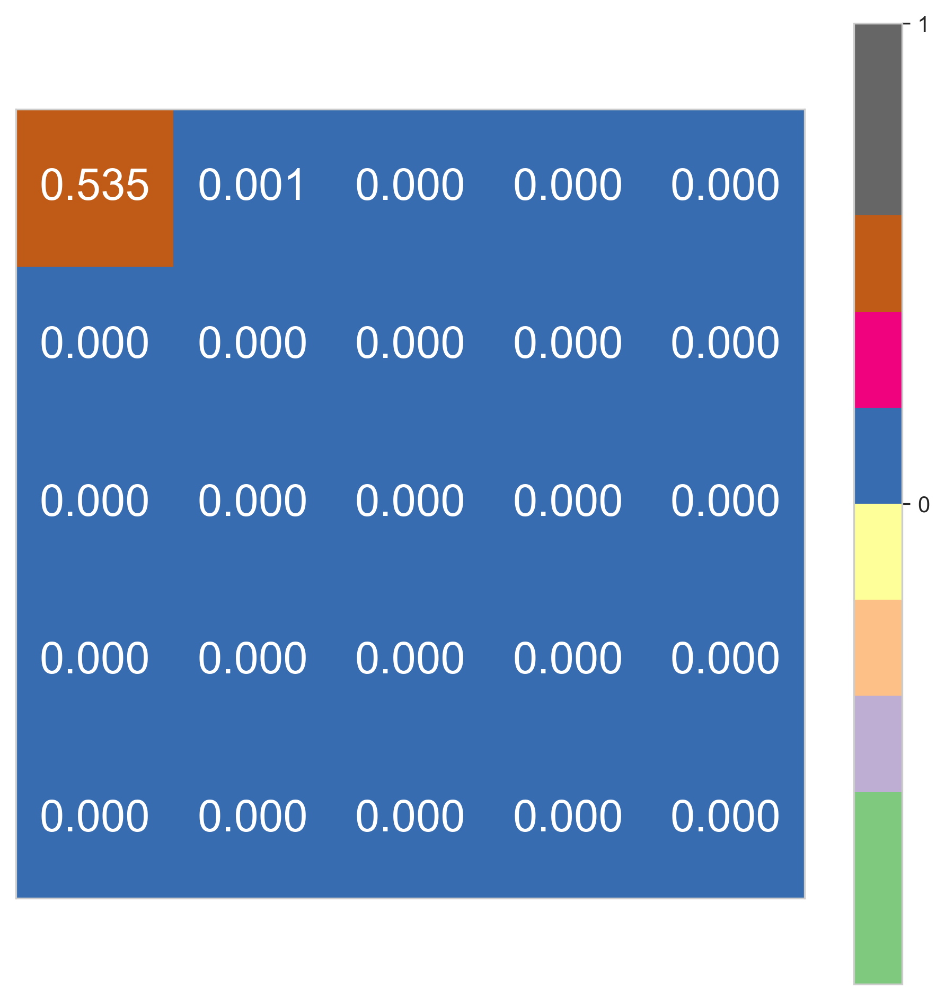

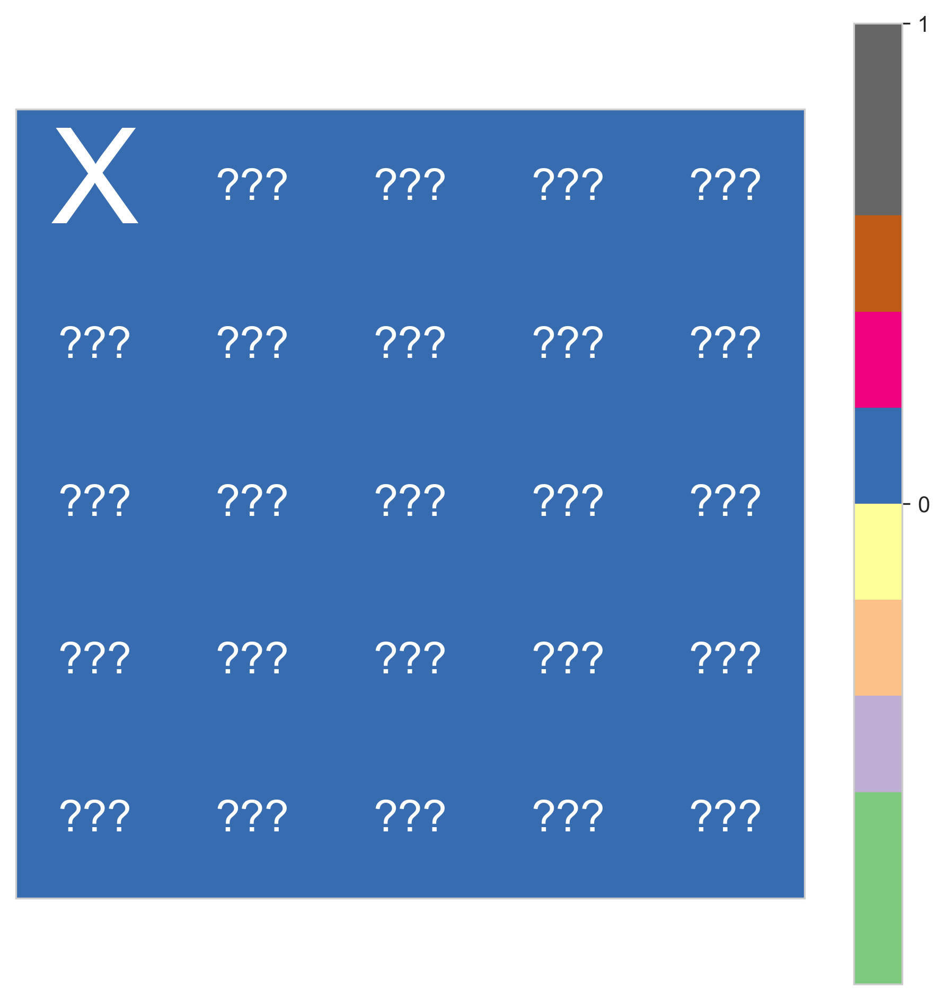

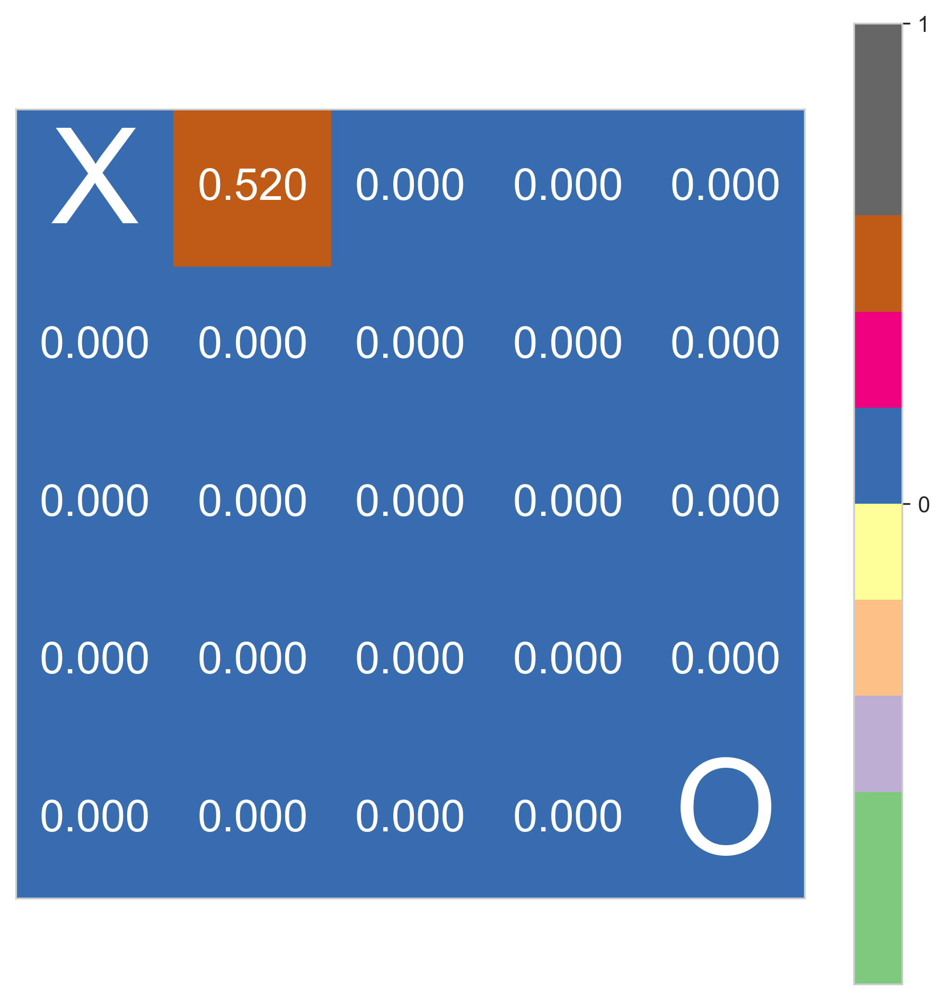

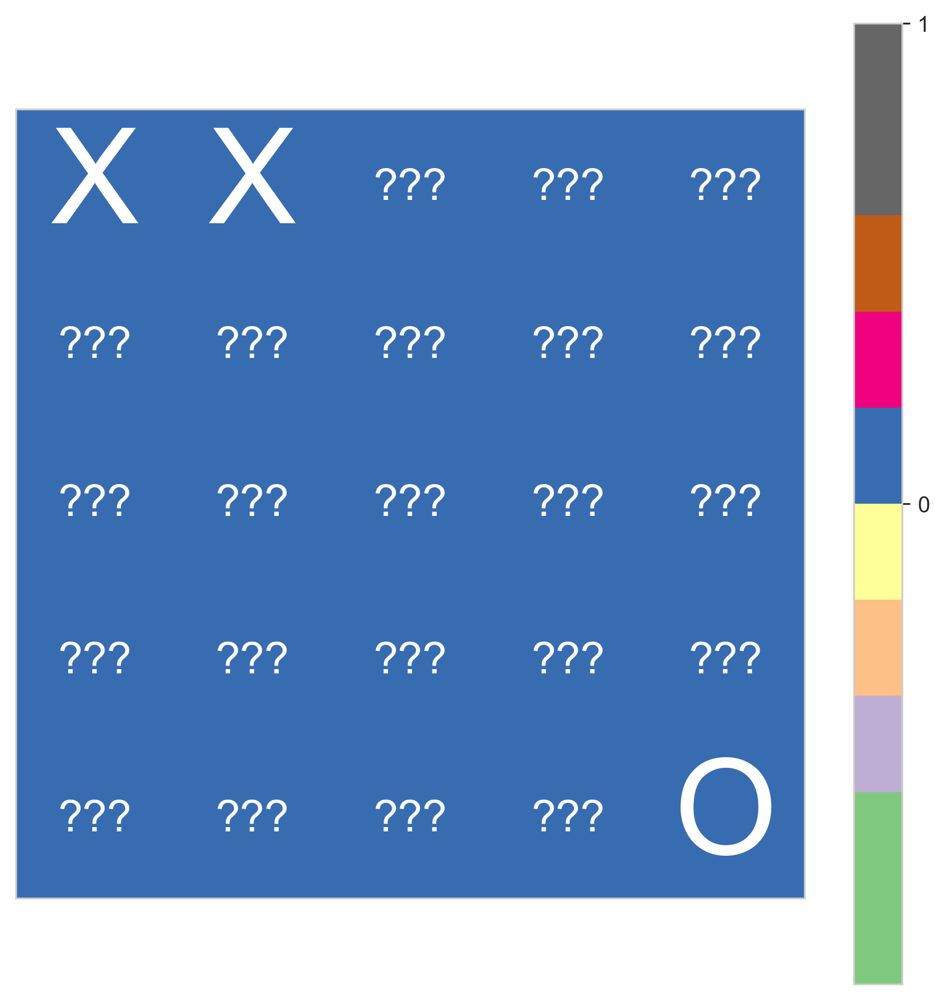

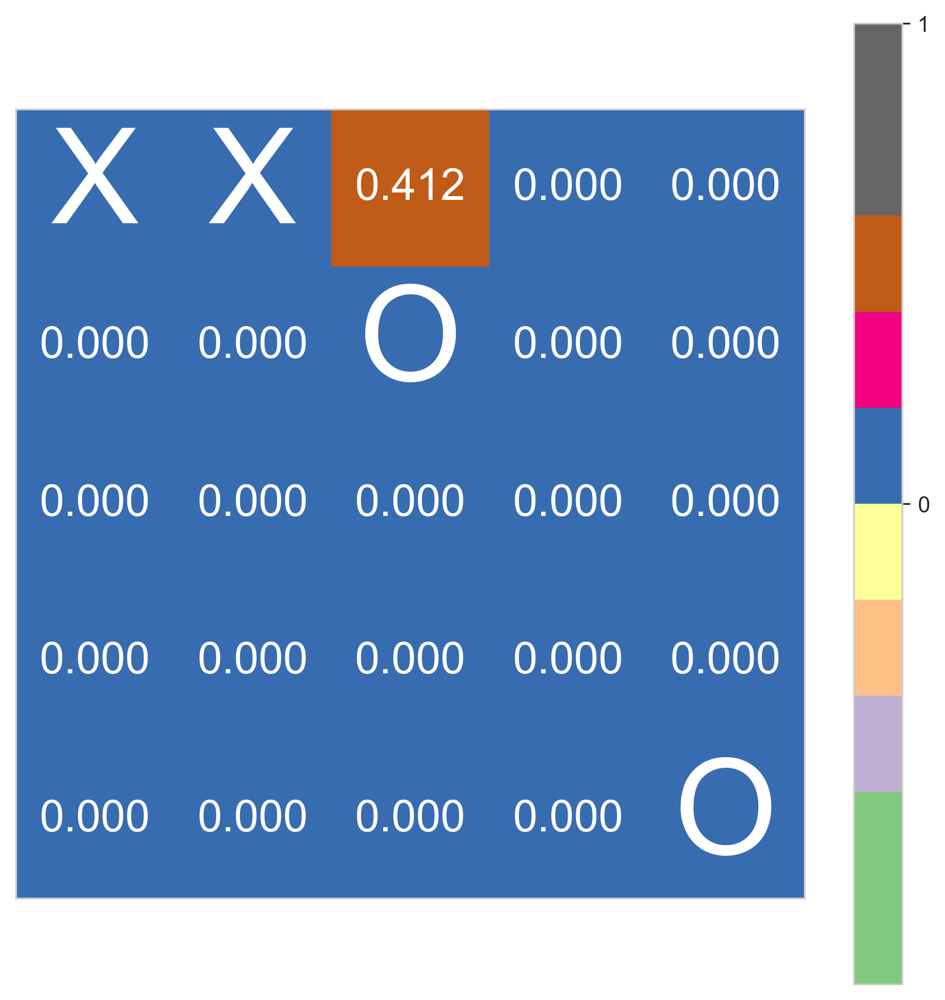

...

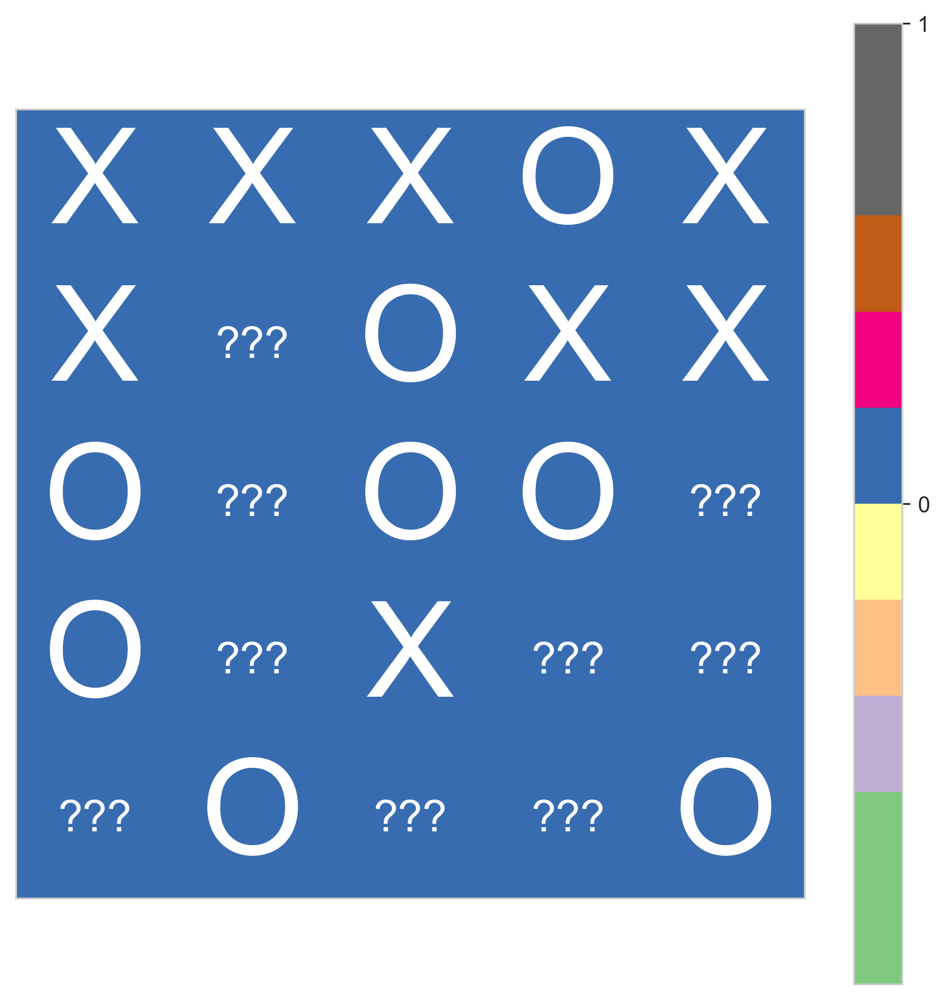

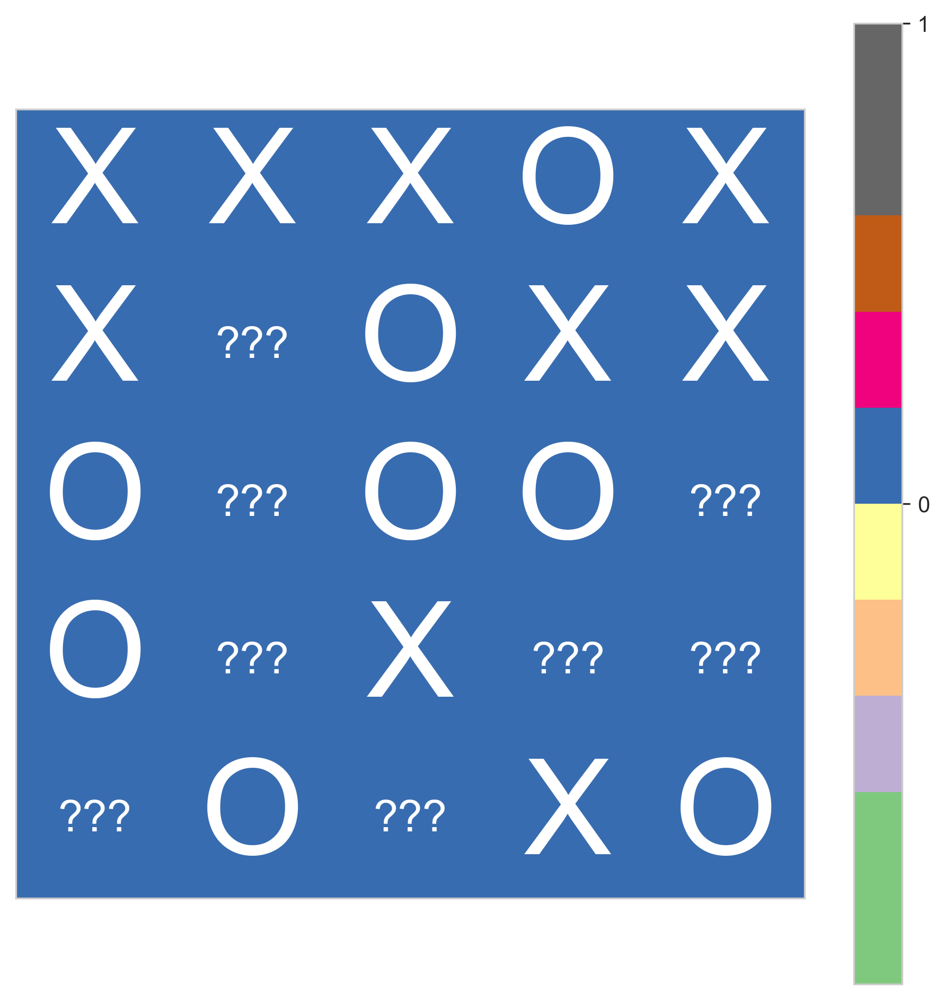

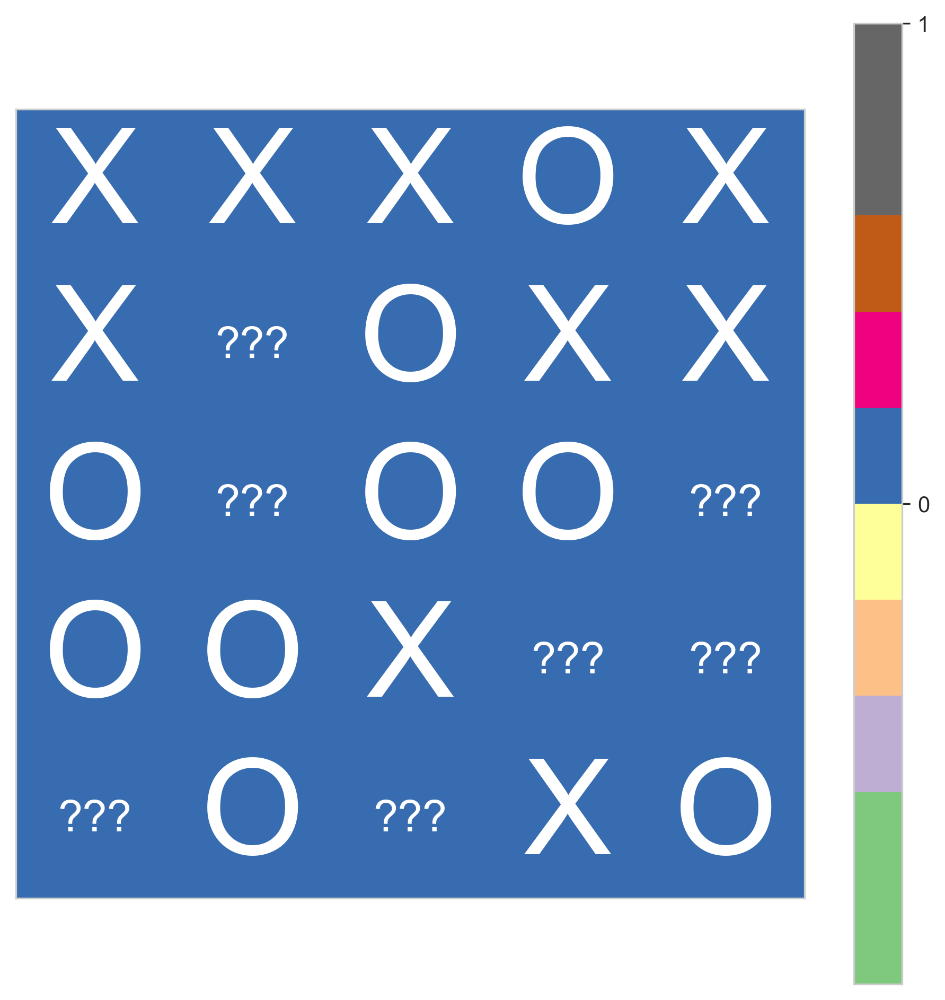

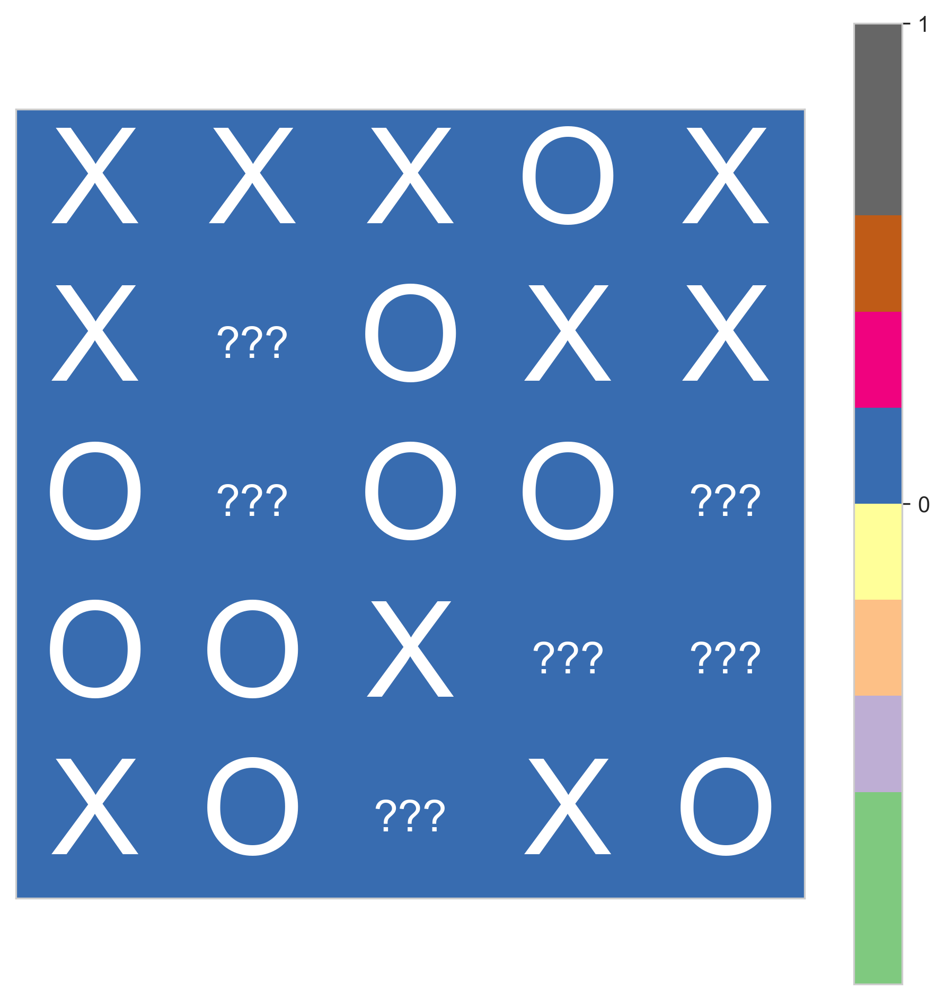

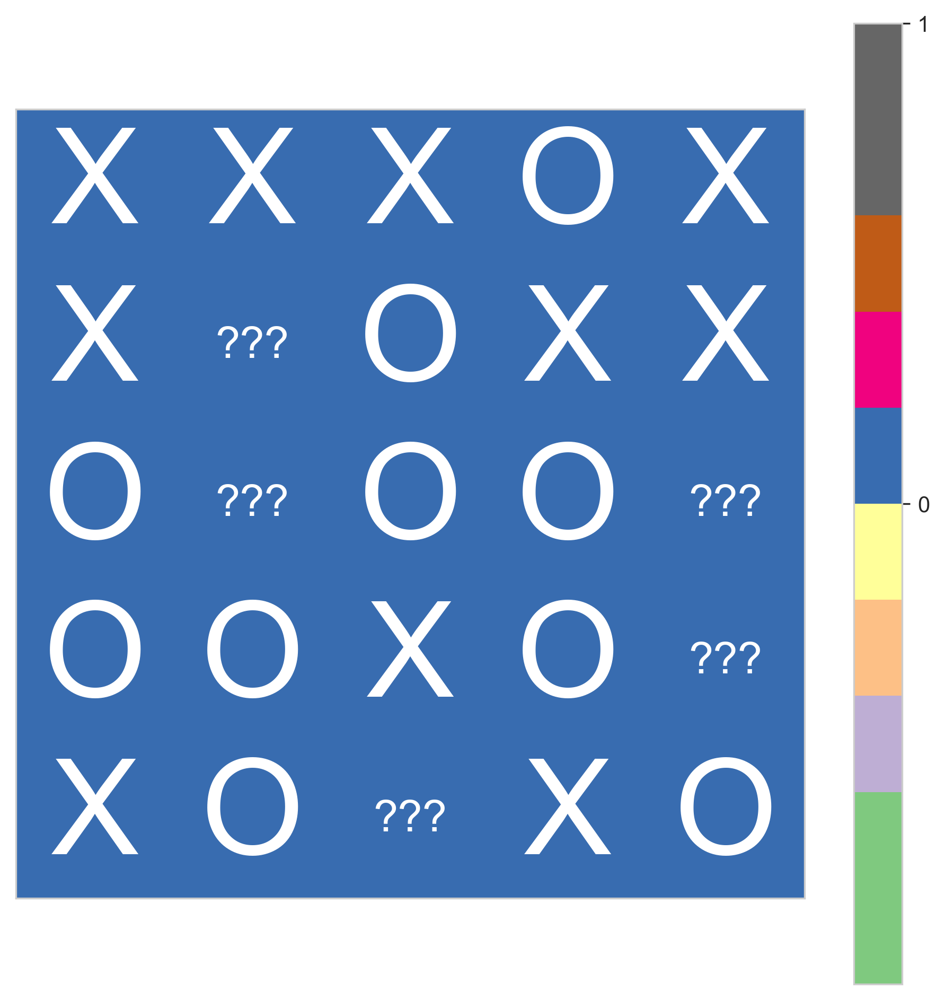

Крестики выиграли!


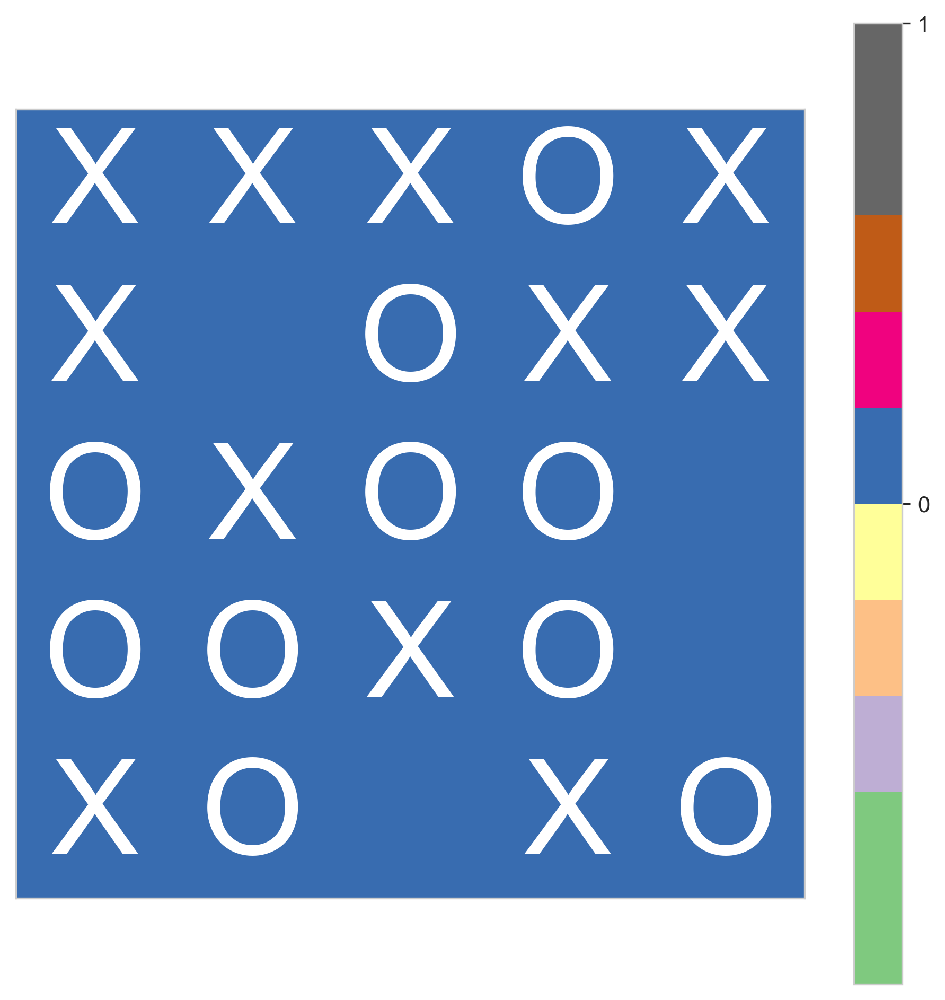

In [133]:
plot_test_game(env, agent_cross, None, random_crosses=False, random_naughts=True, verbose=False)

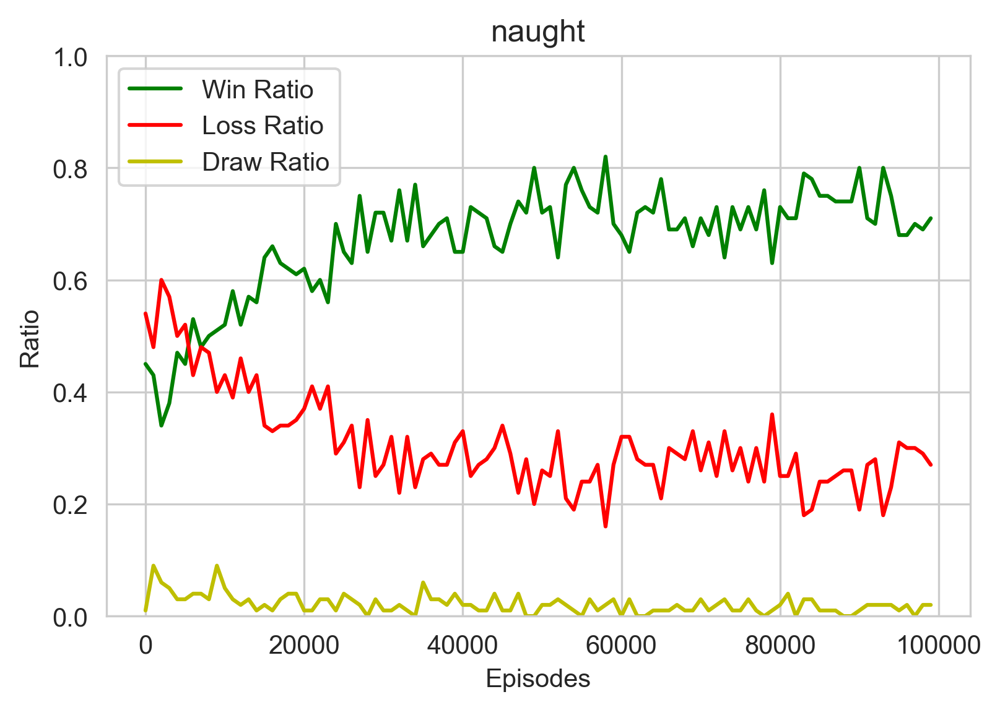

In [134]:
agent_naught, info = train_Q_learning(
    agent_side=-1,
    alpha=0.05,
    episodes=int(1e5),
    epsilon=0.3,
    epsilon_decay = 0.95,
    n_rows=5,
    n_cols=5,
    n_win=4,
)

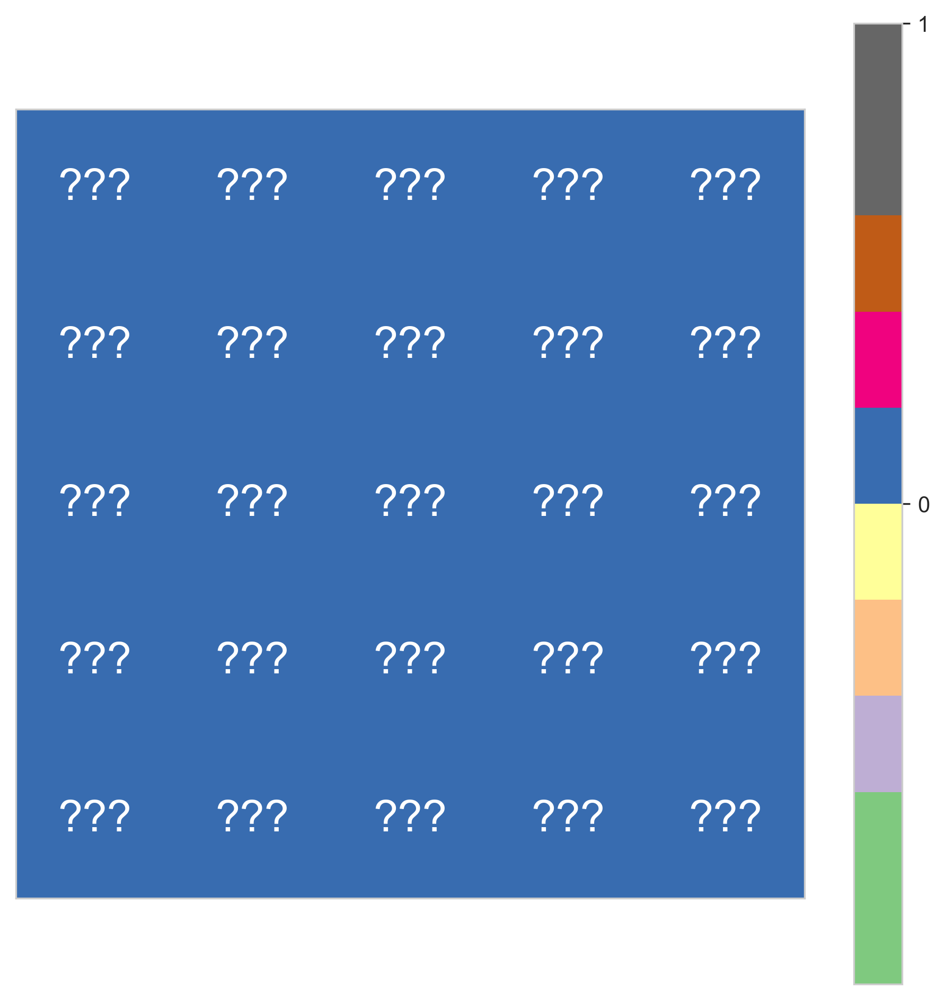

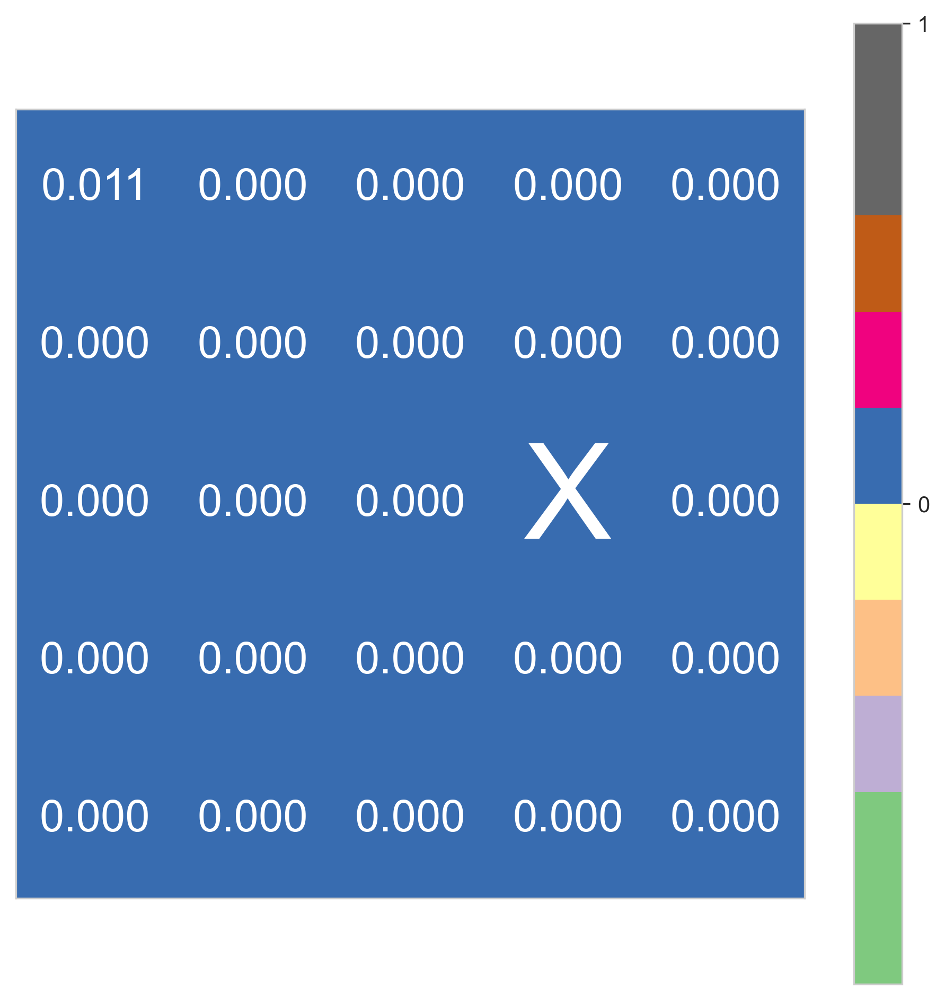

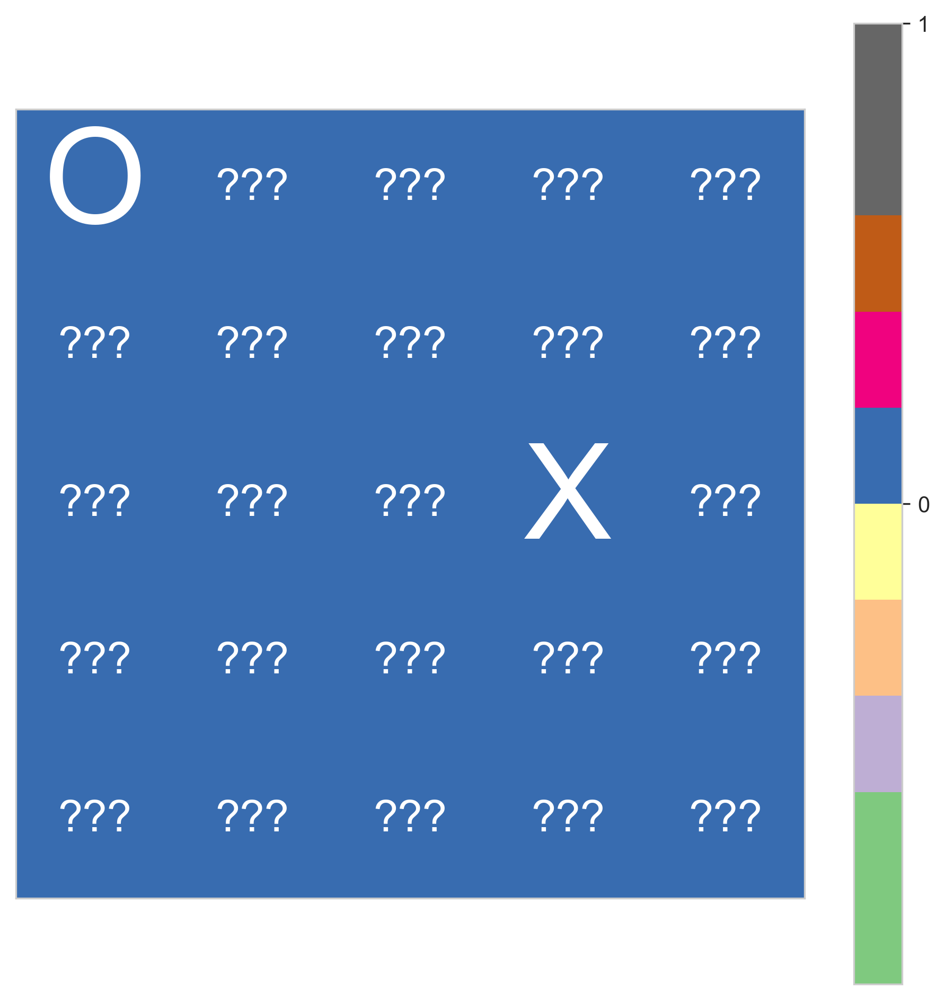

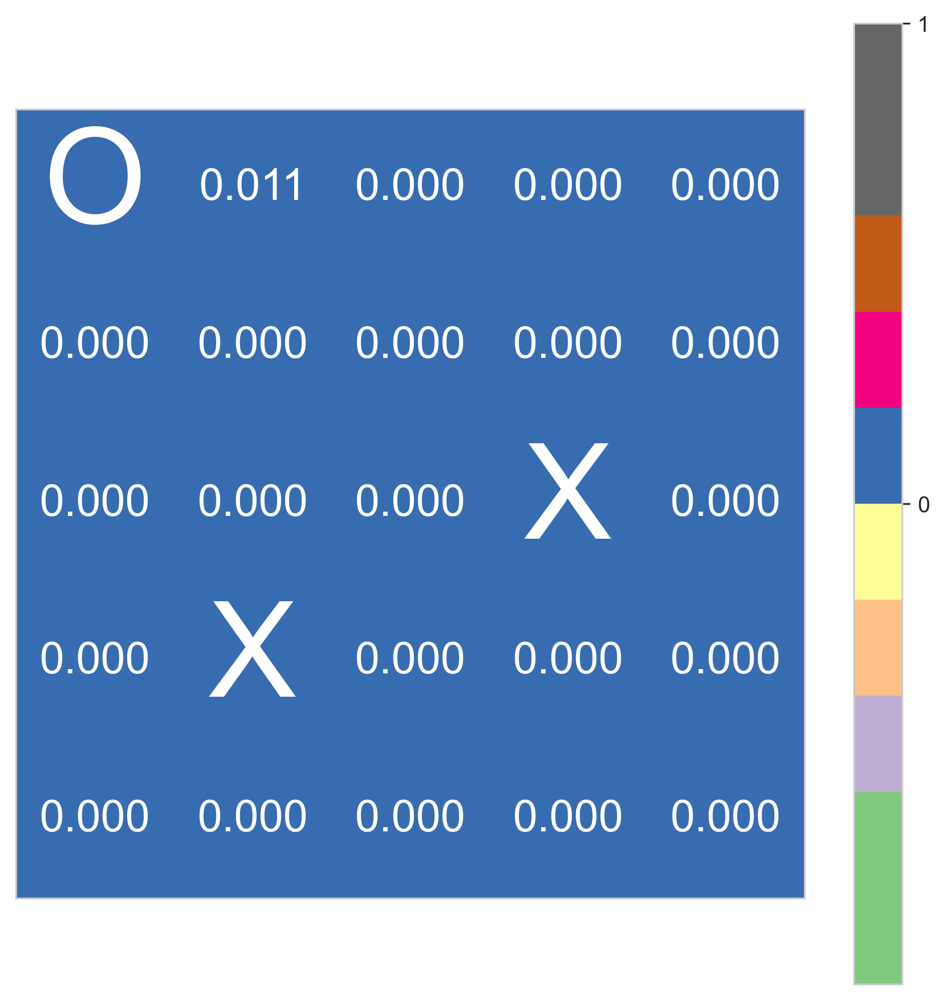

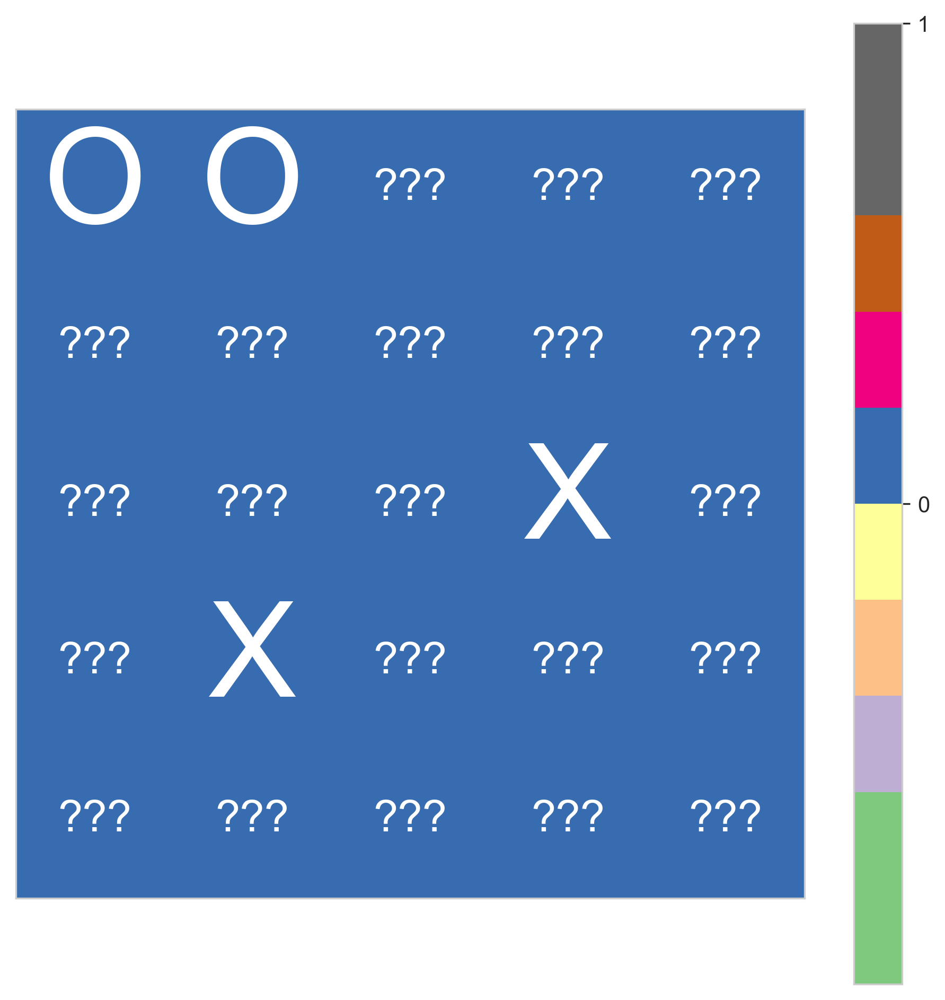

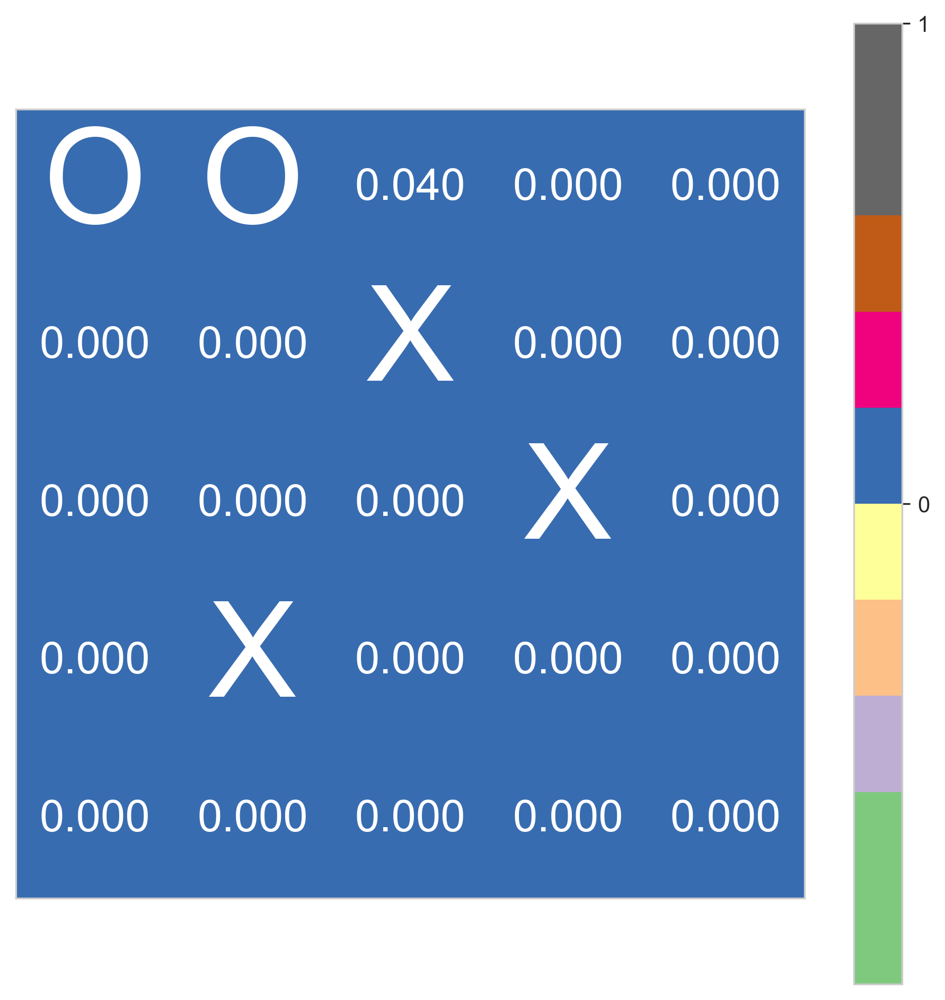

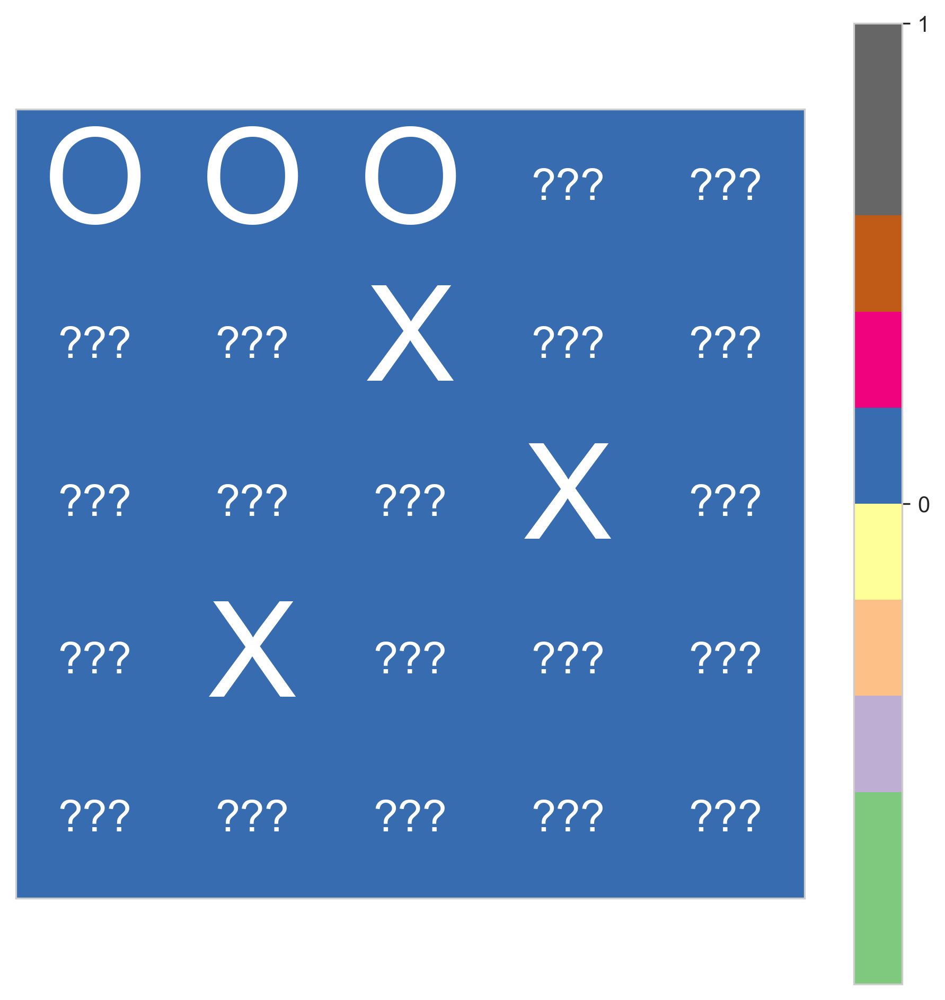

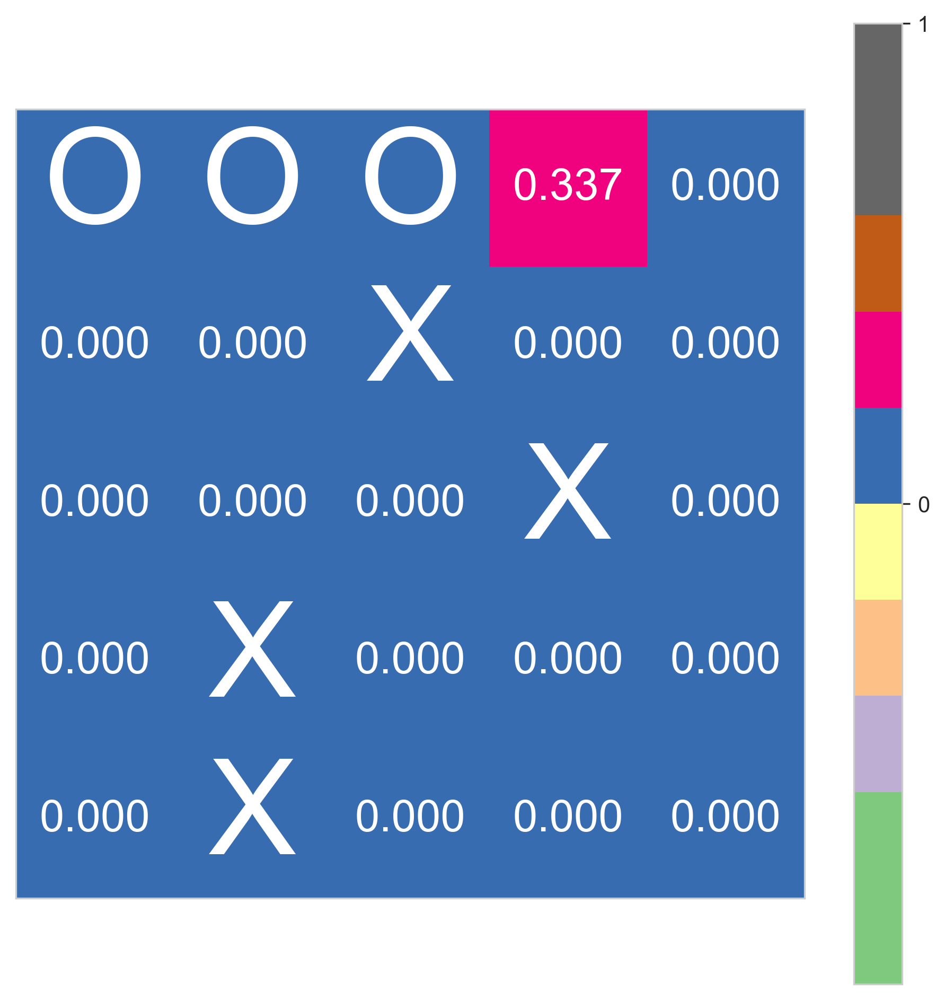

Нолики выиграли!


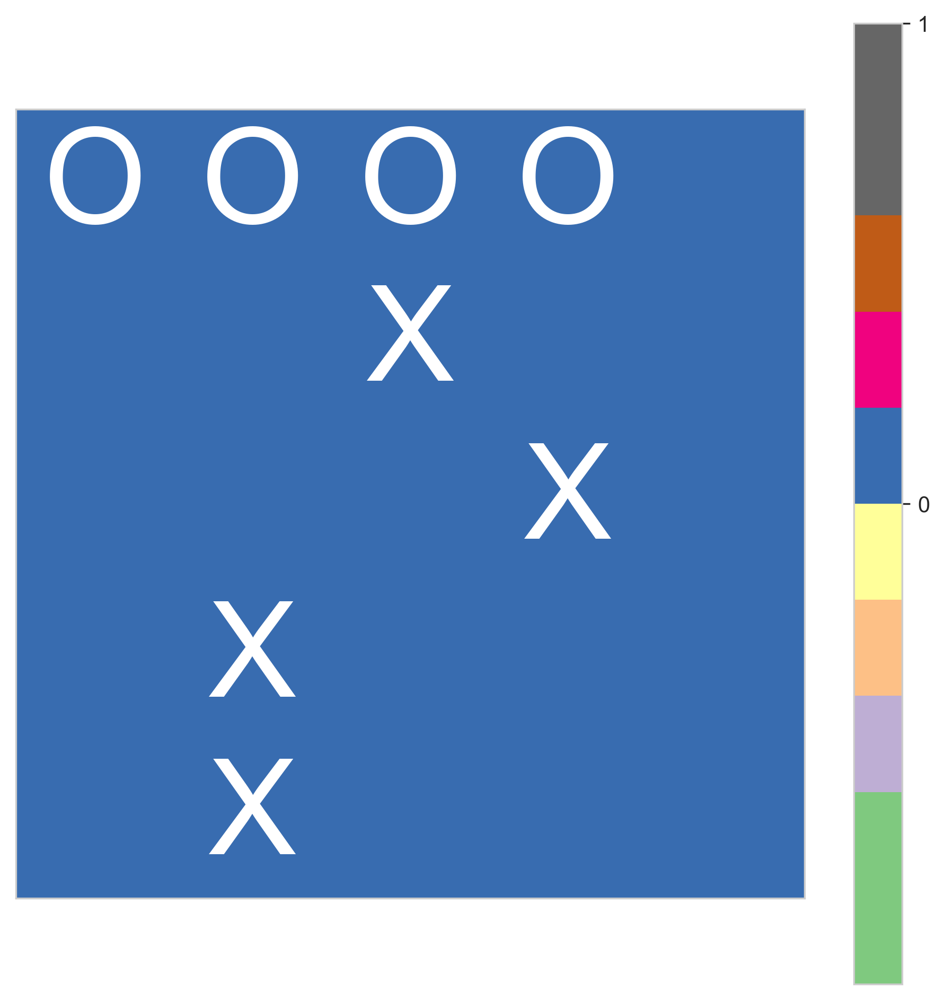

In [135]:
plot_test_game(env, None, agent_naught, random_crosses=True, random_naughts=False, verbose=False)

### Игра агентов против друг друг

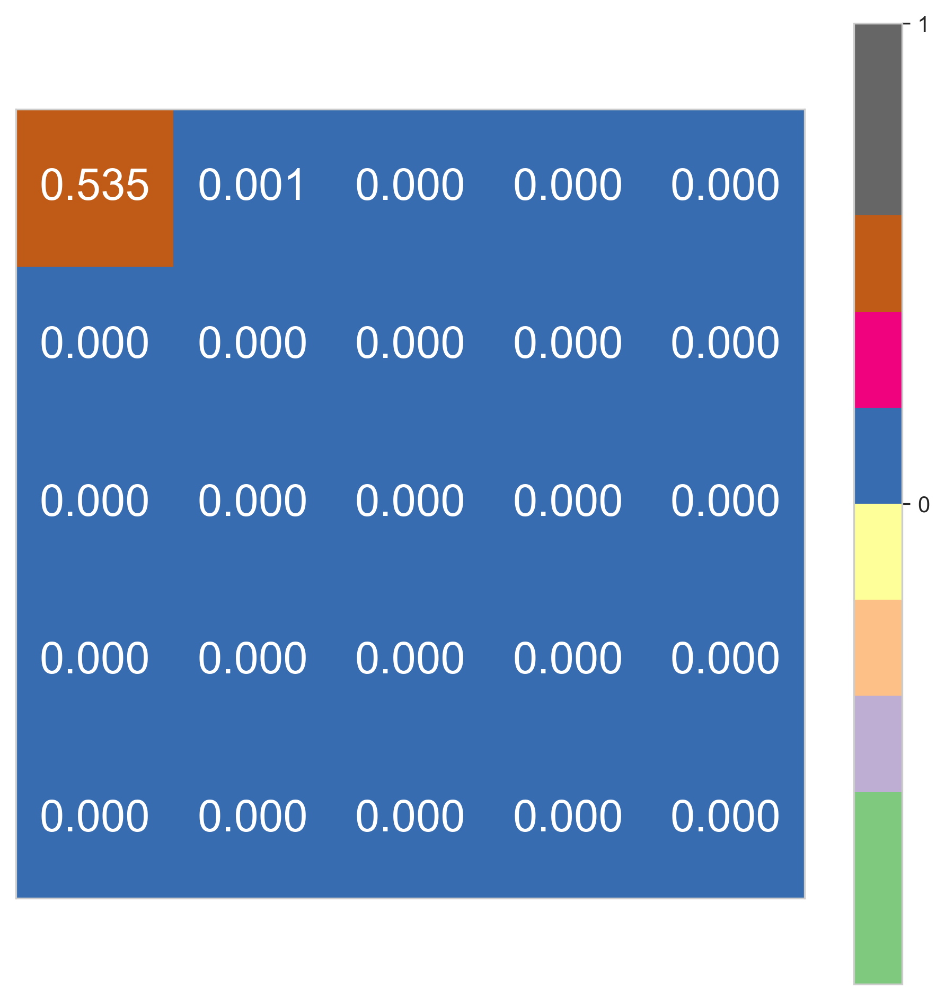

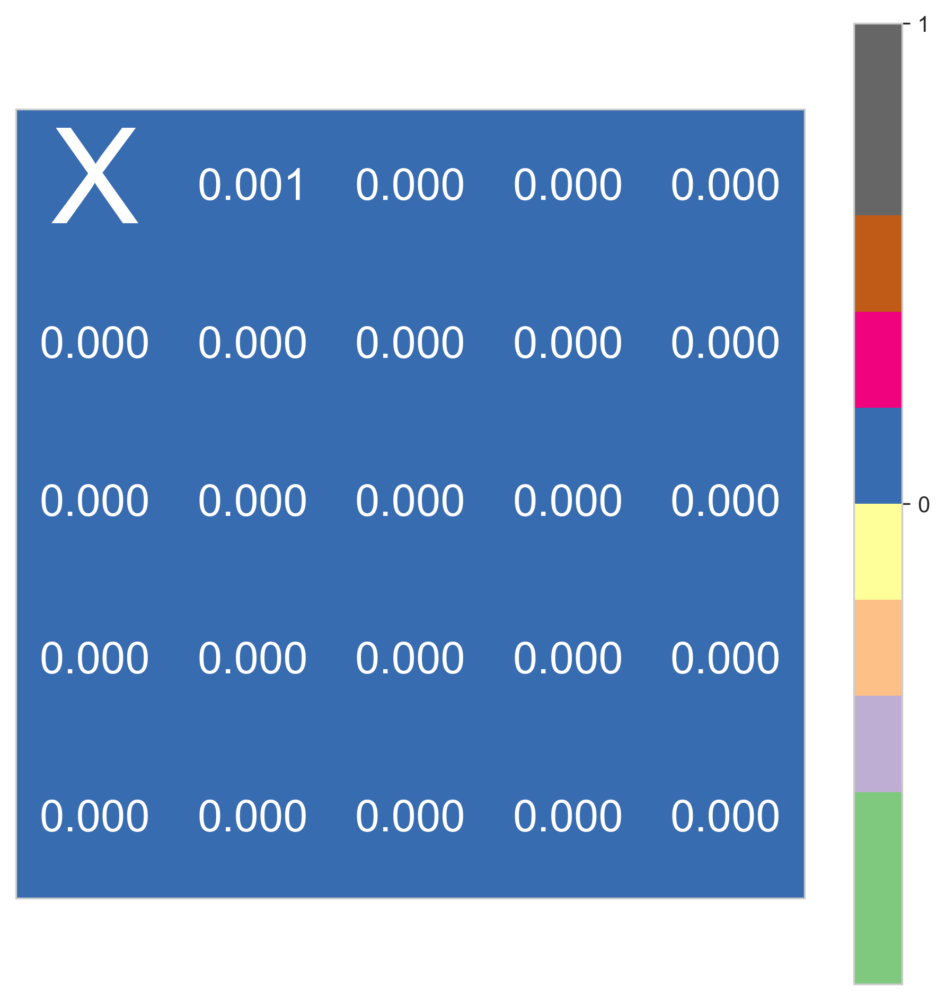

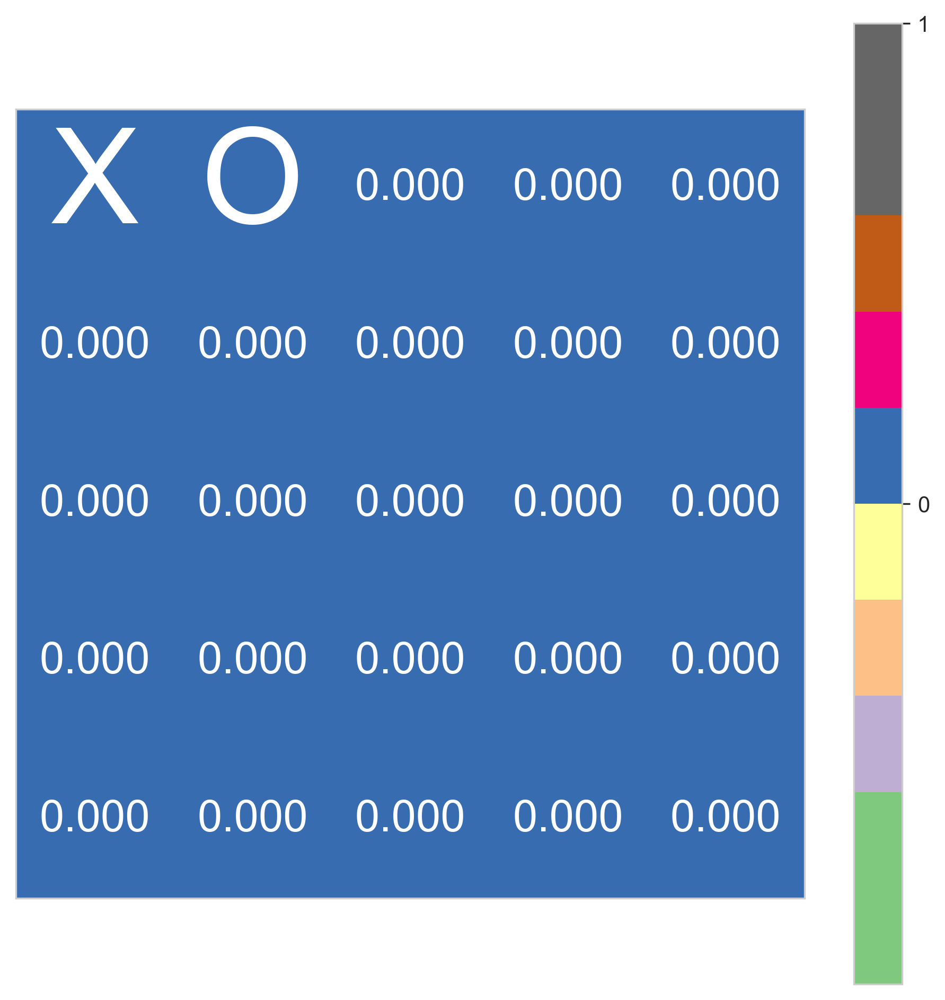

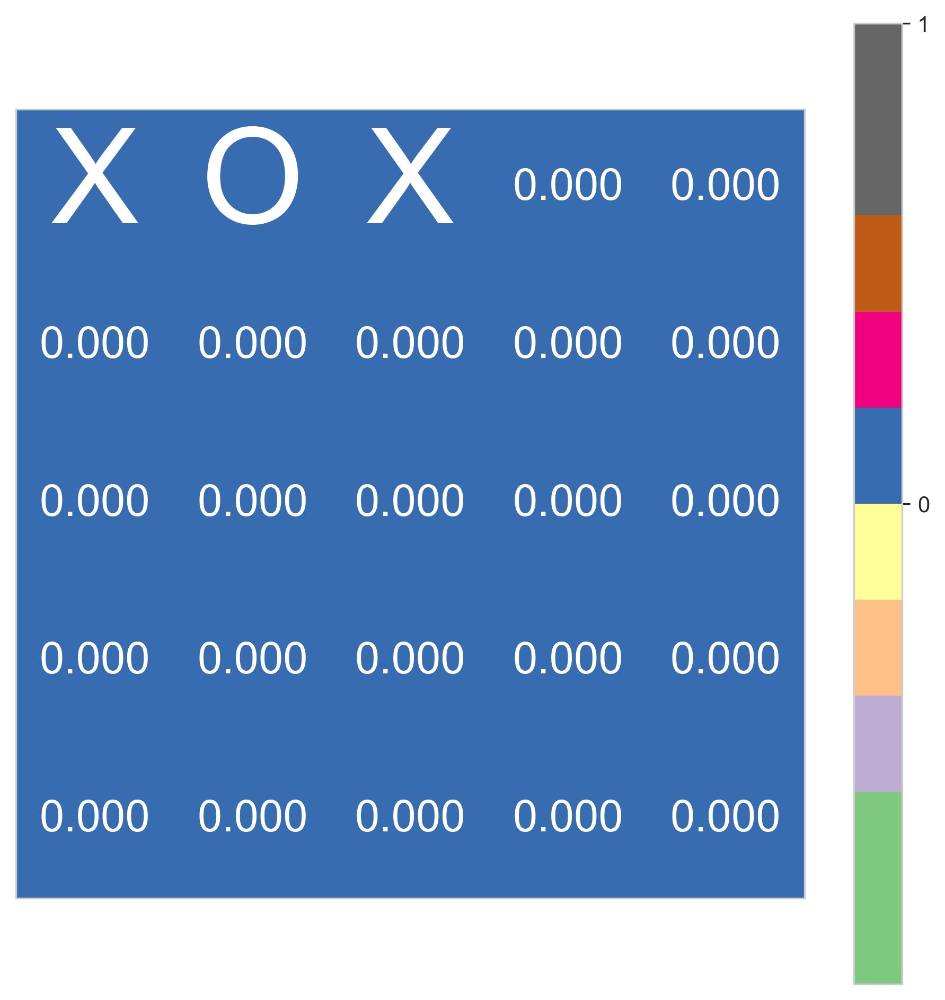

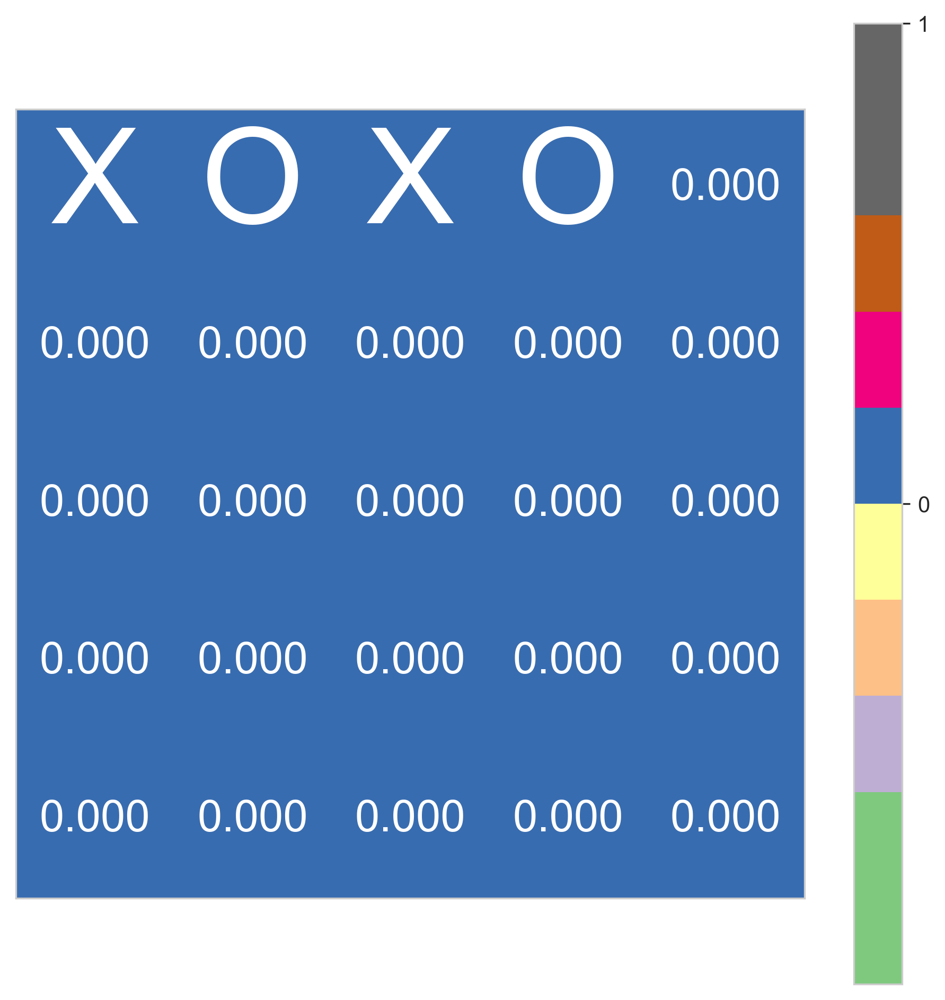

...

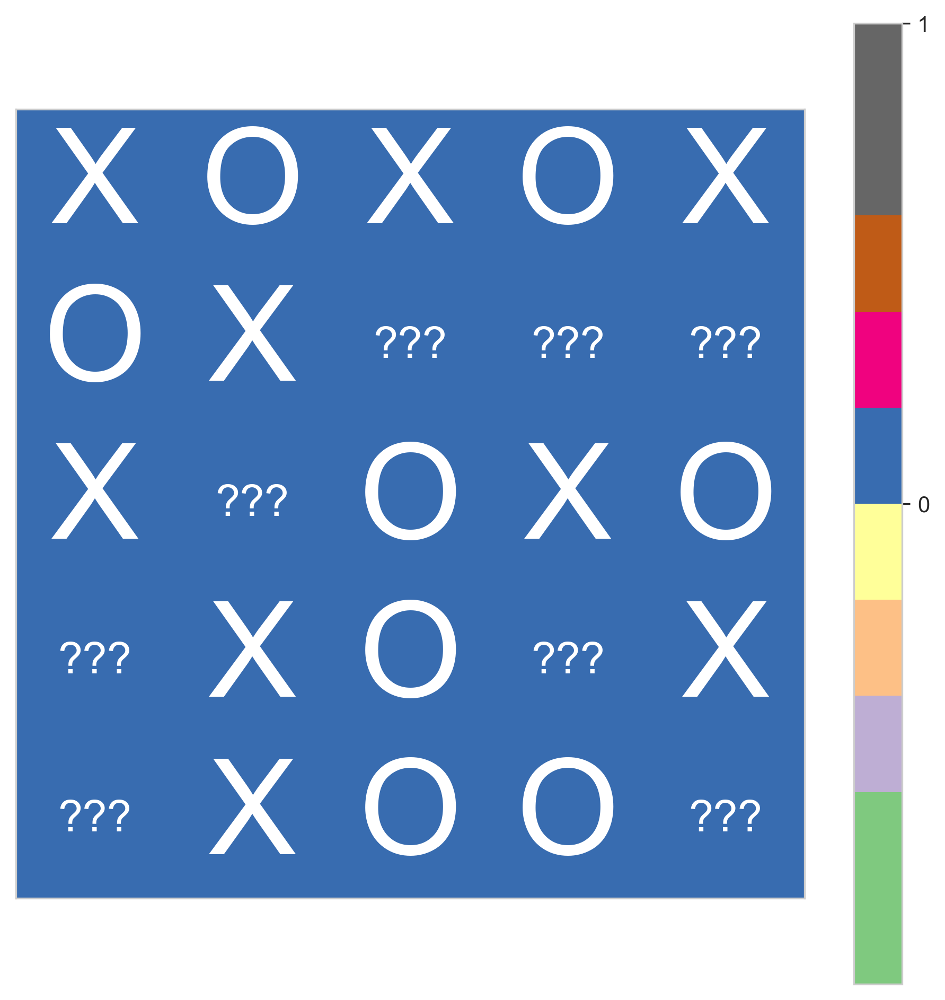

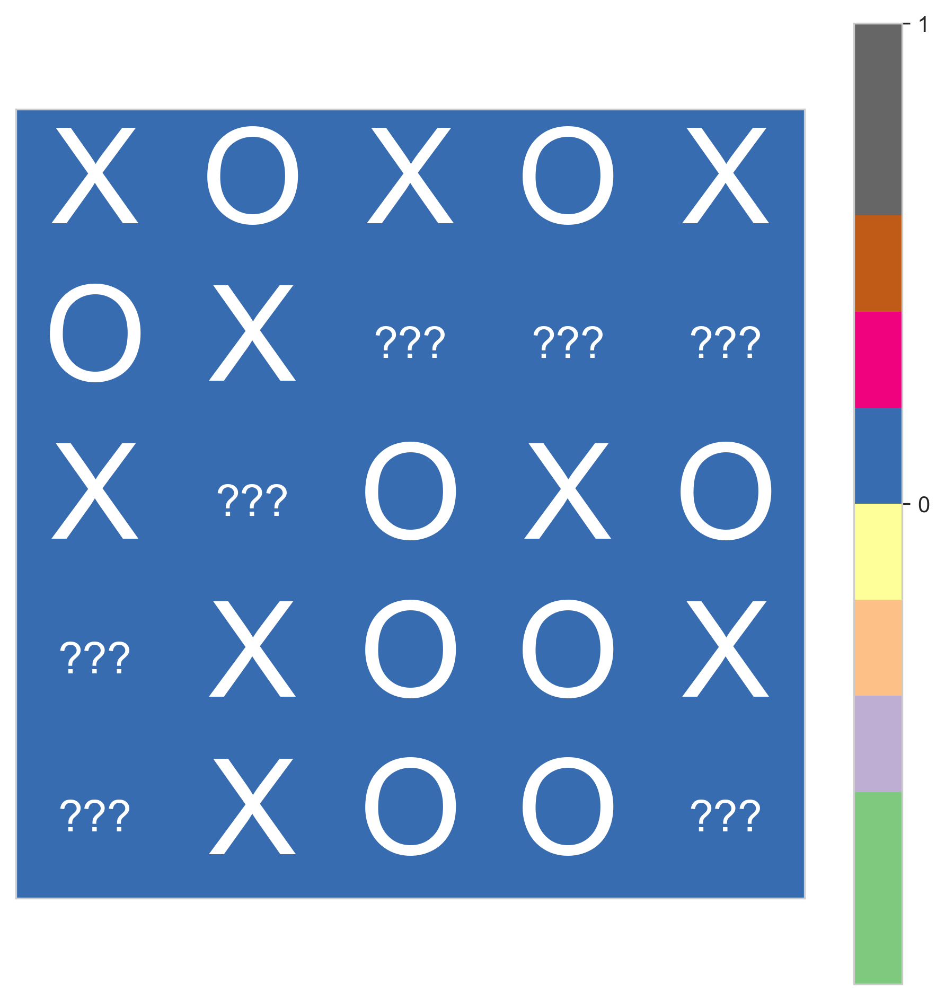

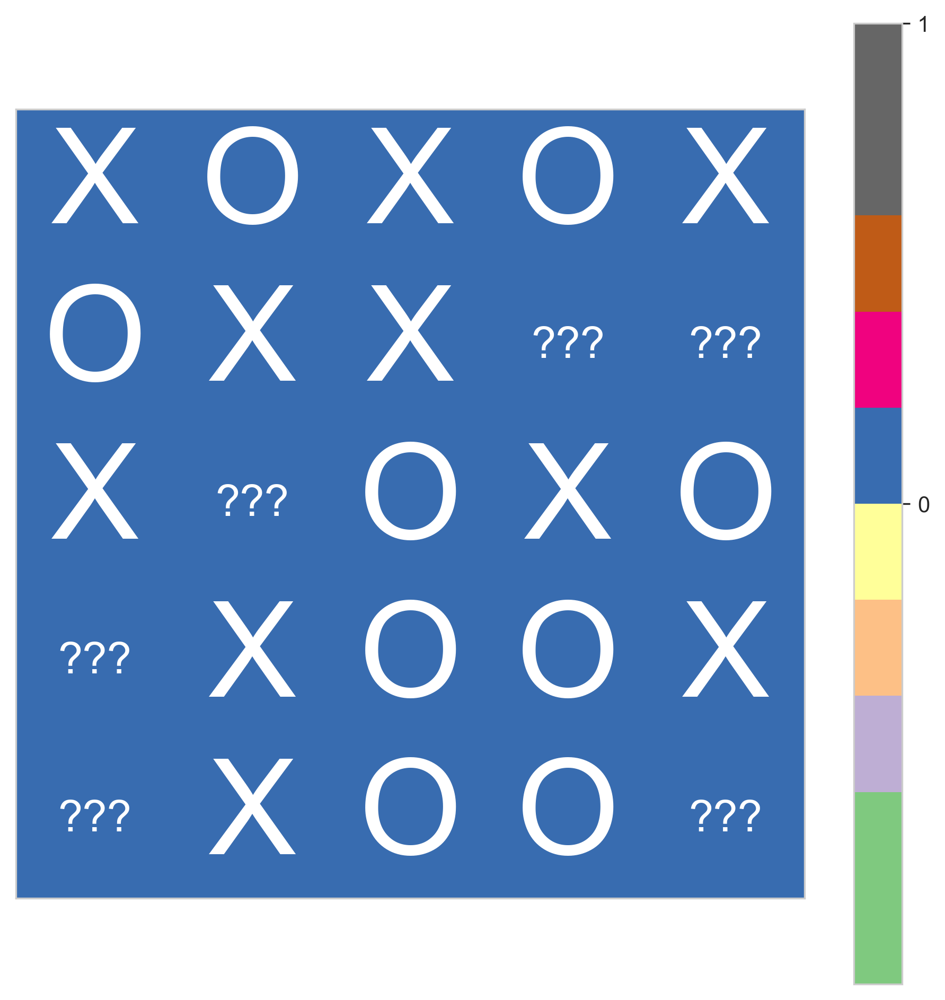

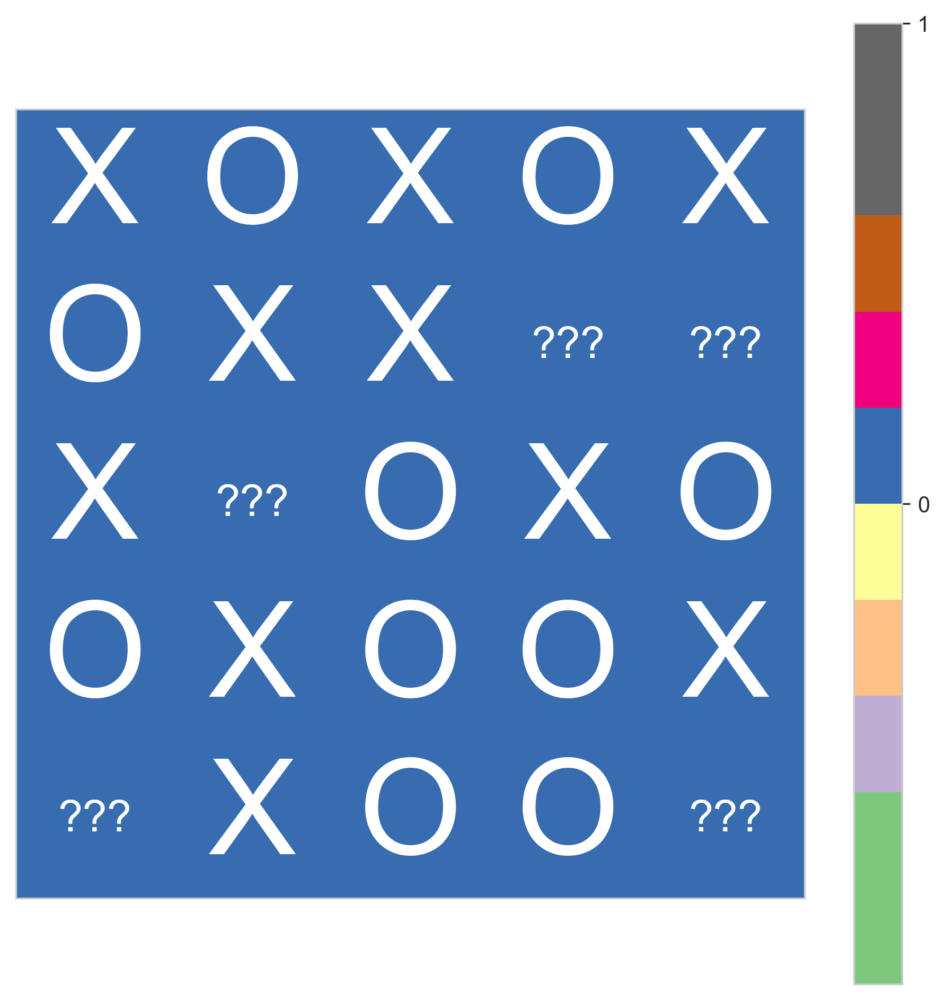

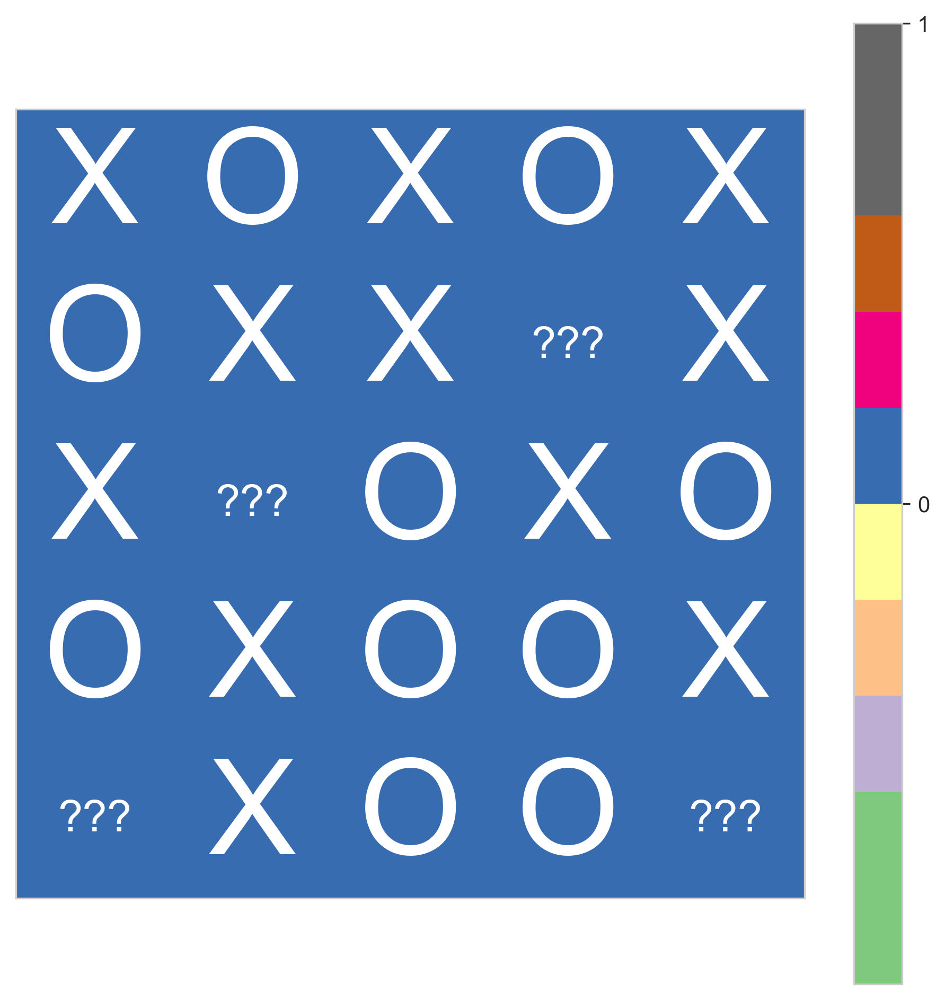

Нолики выиграли!


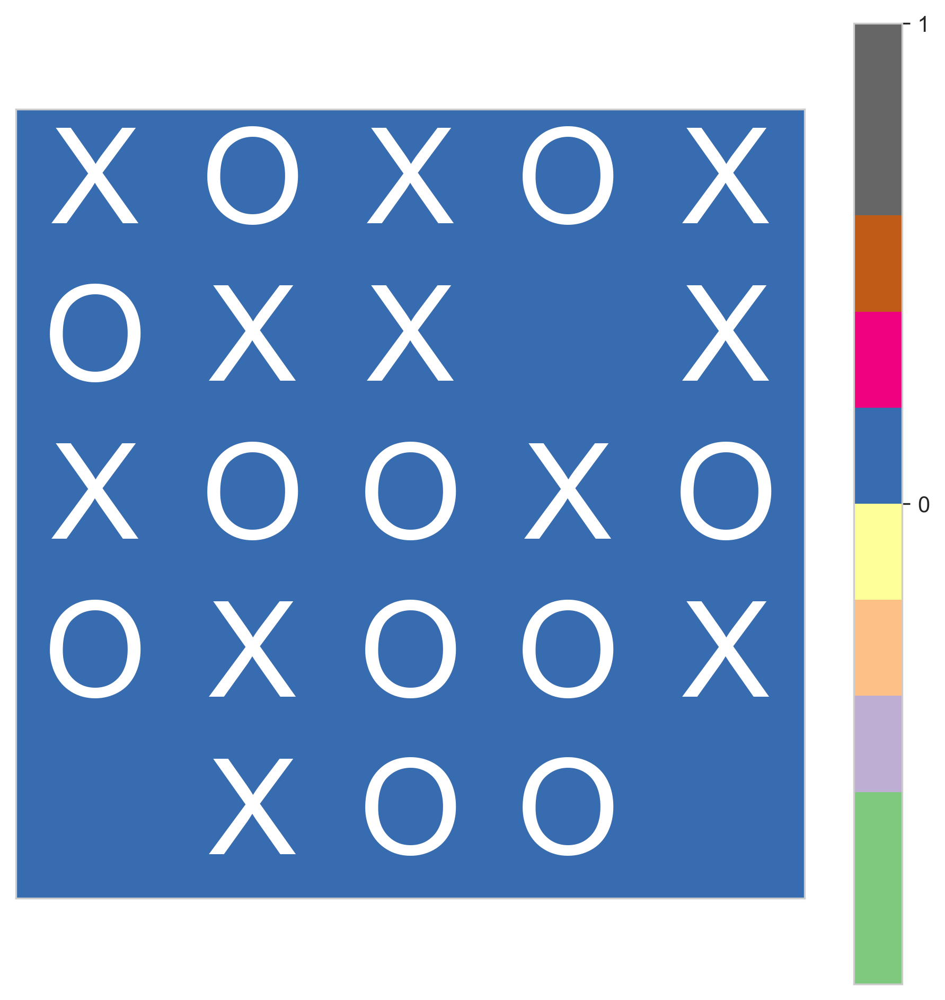

In [136]:
plot_test_game(env, agent_cross, agent_naught, random_crosses=False, random_naughts=False, verbose=False)

Выводы.
- Первую часть удалось сделать полностью
- Табличное Q-learning работает для досок размеров 3х3 и 5х5.
- Для доски размера 3х3 очень велико преимущество первого хода.
- При очень большом (1е6) количестве эпизодов значения Q(s0, a) очень близки и стремятся к единице (вероятно, так как берем максимум при по Q на следующем шаге при случайной стратегии второй стороны). Возможно, помог бы gamma < 1 для подсчета G_t
- epsilon-decay особой погоды не сделал. С другой стороны, "на глаз" оценить сложно.

Не очень понятно, нормально ли обновлять агента на случайных шагах противника. В любом случае, работает заметно лучше случайной политики

# Часть 2: добавим нейронных сетей

Реализуем Double DQN с  experience replay (deque). Структура решения была адаптирована из первой домашней работы (Lunar Lander) курса Прикладное RL. 
К сожалению, не успел доучить :(

Из графика видно что процесс обучения идет

Эту часть можно условно считать выполненной


In [263]:
import torch
from torch import nn
from torch.nn import functional as F
from torch.optim import Adam
from collections import deque
import random
import copy

GAMMA = 0.99
INITIAL_STEPS = 10000
TRANSITIONS = 1000000
STEPS_PER_UPDATE = 4
STEPS_PER_TARGET_UPDATE = STEPS_PER_UPDATE * 1000
BATCH_SIZE = 128
LEARNING_RATE = 5e-4


class DQNAgent():
    
    def __init__(self, agent_side=1, n_rows=3, n_cols=3, n_win=3, memory_capacity=INITIAL_STEPS, hidden_dim=32):
        
        self.device = torch.device("cpu")
        self.steps = 0
        self.agent_side=agent_side
        
        self.n_rows = n_rows
        self.n_cols = n_cols
        
        self.action_space = [(ii, jj) for ii, jj in zip(np.where(np.zeros((n_rows, n_cols)) == 0)[0],
                                                         np.where(np.zeros((n_rows, n_cols)) == 0)[1])]
        
        self.model = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=hidden_dim, kernel_size=(3,3), bias=True, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_dim, out_channels=hidden_dim, kernel_size=(3,3), bias=True, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_dim, out_channels=1, kernel_size=(1, 1), bias = True),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(in_features=n_rows * n_cols, out_features=n_rows * n_cols, bias=True)
        )
        
        self.model_target = copy.deepcopy(self.model)
        
        self.memory_capacity = memory_capacity
        self.memory = deque([], maxlen=memory_capacity)

        self.optimizer = Adam(self.model.parameters(), lr=LEARNING_RATE)
    
    def consume_transition(self, transition):
        # Add transition to a replay buffer.
        
        self.memory.append(transition)
        
    def hashToModelInput(self, state):
        
        state_tensor = torch.tensor(
            np.array(list(map(int, state))).reshape(1, self.n_rows, self.n_cols),
            requires_grad=False,
        ).float()
        return state_tensor
        
    def act(self, state):
        self.model.eval()
        with torch.no_grad():
            a = self.action_space[torch.argmax(self.model(self.hashToModelInput(state)), dim=-1)]
        self.model.train()
        return a
    
    def getAction(self, state):
        self.model.eval()
        with torch.no_grad():
            a = torch.argmax(self.model(self.hashToModelInput(state)), dim=-1)
        self.model.train()
        return a
    
    def sample_batch(self, batch_size=BATCH_SIZE):
        
        experiences = random.sample(self.memory, k=BATCH_SIZE)
        
        batch_state = torch.concat([self.hashToModelInput(e[0]).unsqueeze(0) for e in experiences], dim=0).float().to(self.device)
        batch_action = torch.tensor([e[1] for e in experiences]).reshape(-1, 1).long().to(self.device)
        
        # Инвертирую награды если играем за нолики
        batch_reward = torch.tensor([e[2] * self.agent_side if e[2] > -9 else e[2] for e in experiences]).reshape(-1,1).float().to(self.device)
        
        batch_new_state = torch.concat([self.hashToModelInput(e[3]).unsqueeze(0) for e in experiences], dim=0).float().to(self.device)
        batch_done = torch.tensor([e[4] for e in experiences]).reshape(-1,1).float().to(self.device)
        
        return batch_state, batch_action, batch_reward, batch_new_state, batch_done
        
    def update(self, transition):
        self.consume_transition(transition)
        if self.steps % STEPS_PER_UPDATE == 0:
            batch = self.sample_batch()
            self.train_step(batch)
        if self.steps % STEPS_PER_TARGET_UPDATE == 0:
            self.update_target_network()
        self.steps += 1
    
    def update_target_network(self):

        self.model_target.load_state_dict(copy.deepcopy(self.model.state_dict()))
    
    def train_step(self, batch):
        # Use batch to update DQN's network.

        states, actions, rewards, next_states, dones = batch

        self.model_target.eval()
        with torch.no_grad():
            q_targets_next = self.model_target(next_states.to(self.device)).detach().max(1)[0].unsqueeze(1).to(torch.device("cpu"))
        self.model_target.train()
        

        
        
        q_targets = rewards + GAMMA * q_targets_next * (1 - dones)
        
        q_expected = self.model(states.to(self.device)).to(torch.device("cpu")).gather(1, actions)

        loss = F.mse_loss(q_expected, q_targets)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
def evaluate_agent_dqn(env, agent, agent_side, n_attempts=100):
    win_ratio = 0.0
    lose_ratio = 0.0
    for ii in range(n_attempts):
        env.reset()
        done = False 
        s, actions = env.getHash(), env.getEmptySpaces()
        while not done:
            
            if agent.agent_side == env.curTurn:
                a = agent.act(s)
                (s_new, actions_new, turn_num), r, done, _ = env.step(a)
            else:
                a = np.random.randint(len(actions))
                (s_new, actions_new, turn_num), r, done, _ = env.step(actions[a])
                
            r = r * agent_side
            
            
            s = s_new
            actions = actions_new
            
        win_ratio += (r == 1)
        lose_ratio += (r == -1)
    win_ratio = win_ratio / n_attempts
    lose_ratio = lose_ratio / n_attempts
    
    return win_ratio, lose_ratio, 1 - win_ratio - lose_ratio

def train_DQN(agent_side, n_rows=3, n_cols=3, n_win=3, episodes=TRANSITIONS):
    
    agent = DQNAgent(agent_side=1, n_rows=n_rows, n_cols=n_cols, n_win=n_win)
    
    env = TicTacToe(n_rows=n_rows, n_cols=n_cols, n_win=n_win)
    done = False
    s = env.getHash()
    # Заполняем память
    for ii in range(INITIAL_STEPS):
        if agent.agent_side == env.curTurn:
            a = np.random.randint(len(agent.action_space))
            (s_agent, _, _), r, done, _ = env.step(agent.action_space[a])
            if done:
                agent.consume_transition((s_agent, a, r, s, done))
                env.reset()
                s = env.getHash()
                done = False
            else:
                a_opponent = np.random.randint(len(env.getEmptySpaces()))
                (s_new, _, _), r, done, _ = env.step(env.getEmptySpaces()[a_opponent])
                agent.consume_transition((s, a, r, s_new, done))
                if done:
                    env.reset()
                    s = env.getHash()
                    done = False
                
        else:
            a_opponent = np.random.randint(len(env.getEmptySpaces()))
            (s_new, _, _), _, done, _ = env.step(env.getEmptySpaces()[a])
            
        s = s_new
        
    print("Initialization is completed")
    
    learning_progress = list()
    env.reset()
    s = env.getHash()
    done = False 
    # Учимся
    for ii in range(episodes):
        if agent.agent_side == env.curTurn:
            a = agent.getAction(s)
            (s_agent, _, turn_num), r, done, _ = env.step(agent.action_space[a])
            if done:
                agent.update((s, a, r, s, done))
                env.reset()
                s = env.getHash()
                done = False 
            else:
                a_opponent = np.random.randint(len(env.getEmptySpaces()))
                (s_new, _, _), r, done, _ = env.step(env.getEmptySpaces()[a_opponent])
                agent.update((s, a, r, s_new, done))
                if done:
                    env.reset()
                    s = env.getHash()
                    done = False 
        else:
            a_opponent = np.random.randint(len(env.getEmptySpaces()))
            (s_new, _, _), _, done, _ = env.step(env.getEmptySpaces()[a_opponent])  
        
        s = s_new
            


        if ii % int(episodes * 0.01) == 0:
            learning_progress.append((ii, evaluate_agent_dqn(env, agent, agent_side, n_attempts=100)))
            plot_progress(learning_progress, tag= "cross" if agent_side == 1 else "naught")
        
    return agent, learning_progress


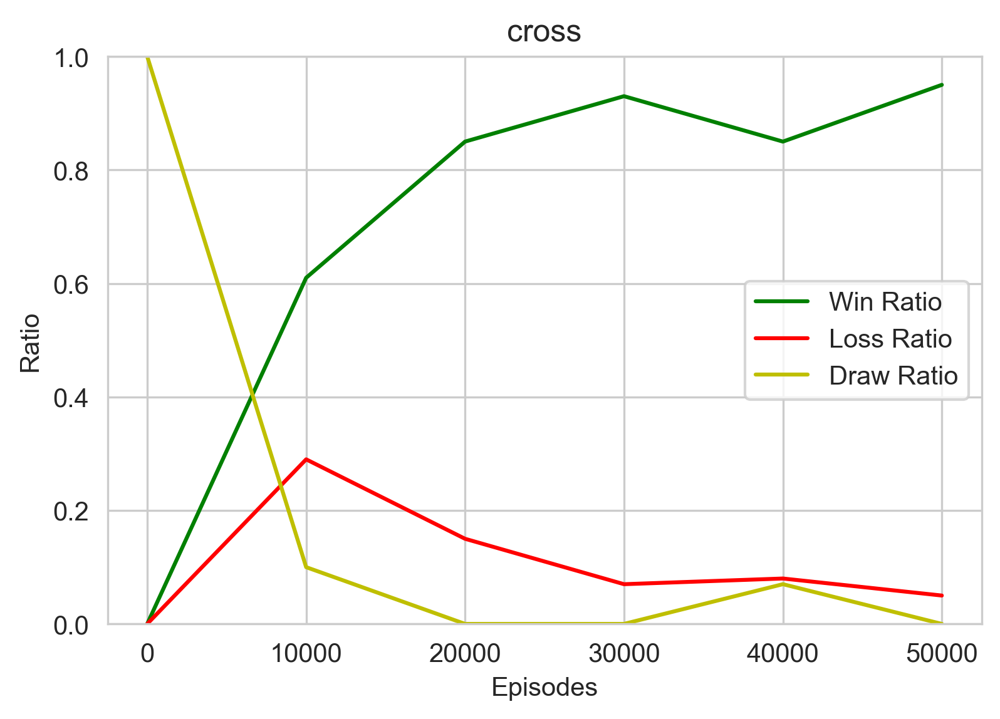

KeyboardInterrupt: 

In [264]:
train_DQN(1, n_rows=3, n_cols=3, n_win=3, episodes=TRANSITIONS)